# Part 1: Using Gradient Descent to Solve Linear Regression

In this part of the lab, you will be requested to solve the linear regression problem using gradient descent. This means you will not use the closed form solution of linear regression to find the model's parameters, but gradient descent. 

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt

For this exercise we will use some dummy data. 

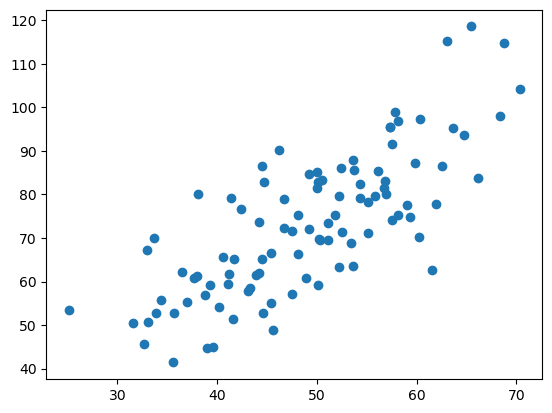

In [2]:
# We will use some dummy data
data = pd.read_csv('data/data.csv')
X = data.iloc[:, 0]
Y = data.iloc[:, 1]
plt.scatter(X, Y)
plt.show()

#Use a friendly format for X and y
X = X.to_numpy().reshape(-1,1)
y = Y.to_numpy().reshape(-1,1)

The data seems to follow a linear model of order one. Hence, we will try to fit the following linear regression model:
\begin{equation}
\hat{y} = \mathbf{w}^{T}\mathbf{x} + w_0
\end{equation}

Let us recall that for linear regression, we use the sum of squares loss function:
\begin{equation}
\mathcal{L} = \dfrac{1}{N}\sum_{i=1}^N(y_i - \hat{y})^2
\end{equation}

### Exercise 1: Implement the gradient descent function
You will need to complete the gradient descent function for linear regression. 

In [3]:
def gradient_descent(alpha, epochs, epsilon, X, y):
    '''
    Performs gradient descent
    Inputs:
    alpha - learning rate
    epochs - number of iterations
    epsilon - threshold to stop iterations
    X - Input matrix of size N x (D + 1)
    y - Output vector of size N x 1

    Outputs:
    weights - Parameters vector of size (D + 1) x 1
    '''
  
    #Initialize weights
    weights = np.zeros((X.shape[1]+1,1))
    
    #Adds a one to the matrix so it copes with w_0
    X = PolynomialFeatures(1).fit_transform(X)
    N = len(X)
    inv_N = float(1/N)
    prev_gradient = 0
    for e in range(epochs):
        
        #1) Estimate y_hat
        y_hat = np.dot(X,weights)
        
        #2) Estimate the gradient
        gradient = -2 * inv_N * np.sum((X * (y - y_hat)))
        gradient_norm = np.linalg.norm(gradient)
        
        print ('Epoch ', e, ' weights: ', weights, 'gradient_norm: ', gradient_norm) 
        
        #3) Check the stopping criterion
        if np.abs(gradient_norm - prev_gradient) <= epsilon:
            break
            
        #4) Update weights
        weights = weights - alpha * gradient
        
        #5) Update previous gradient
        prev_gradient = gradient_norm
        
    return weights

Now, test your implementation:

In [4]:
alpha = 0.0001  # The learning Rate
epochs = 1000  # The number of iterations to perform gradient descent
weights = gradient_descent(alpha, epochs, 0.00001, X, y)

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

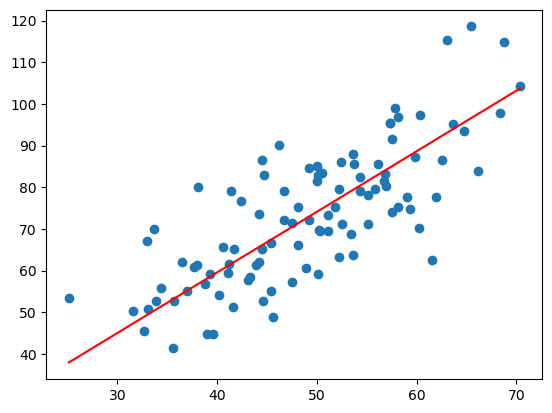

In [5]:
y_hat = np.dot(PolynomialFeatures(1).fit_transform(X),weights)
plt.scatter(X, Y)
plt.plot([min(X), max(X)], [min(y_hat), max(y_hat)], color='red') # predicted
plt.show()

### Question 1: Stopping criterion
Explain what is being done at steps 3 and 5 of the code.

#Your answer

Step 3: Checking the stopping criterion
```python
if np.abs(gradient_norm - prev_gradient) <= epsilon:
   break
```
In this step, the code is checking if the change in the gradient norm from the previous iteration to the current iteration is less than or equal to a specified threshold (`epsilon`). The gradient norm is the magnitude of the gradient vector, and it is calculated using the `np.linalg.norm` function. If the change in the gradient norm is less than or equal to `epsilon`, it means that the algorithm is converging to the minimum of the cost function, and the iterations are stopped to prevent overfitting.

Step 5: Updating the weights
```python
weights = weights - alpha * gradient
```
In this step, the weights are updated by subtracting the product of the gradient and the learning rate (`alpha`) from the current weights. This is done because you want to move in the direction opposite to the gradient to minimize the cost function. The learning rate (`alpha`) determines the step size during each iteration while moving toward a minimum of a loss function. A smaller learning rate requires more iterations to converge but generally results in a more accurate model, while a larger learning rate requires fewer iterations to converge but may overshoot the minimum.

### Exercise 2: Hyper-parameters
Play a bit with the learning rate (alpha), the number of epochs and the stopping criterion. What can you say about the influence these have on your results? Make sure you document all your experiments.

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

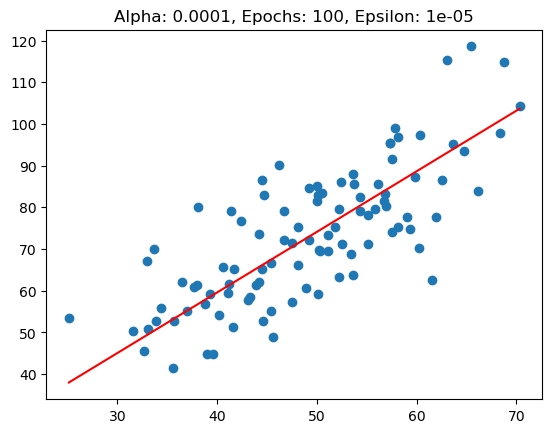

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

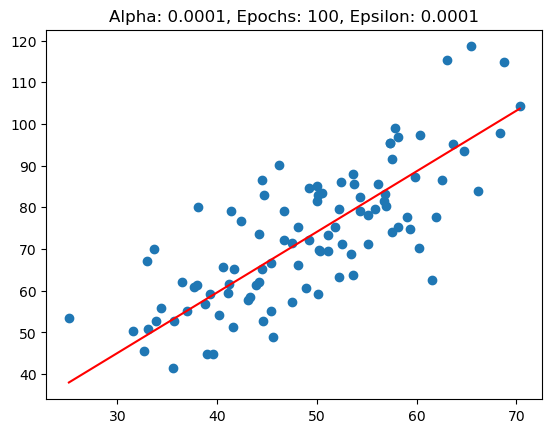

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

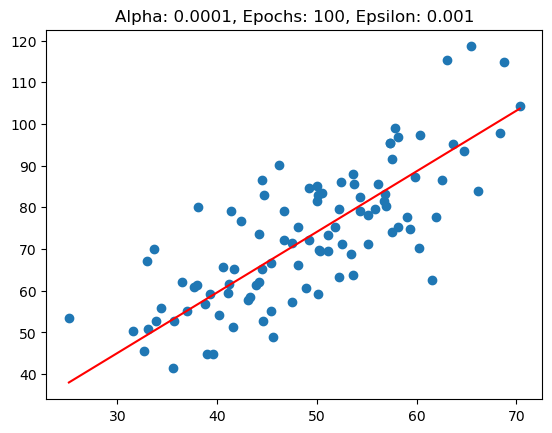

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

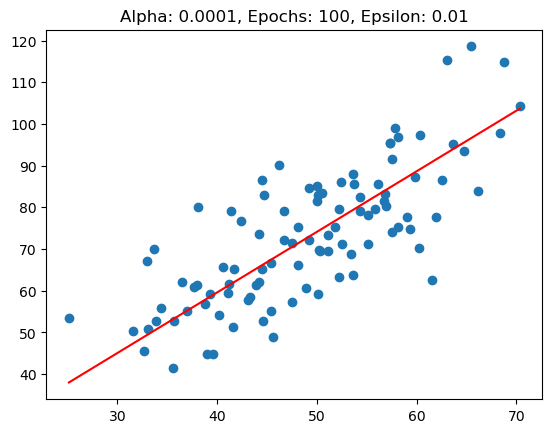

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

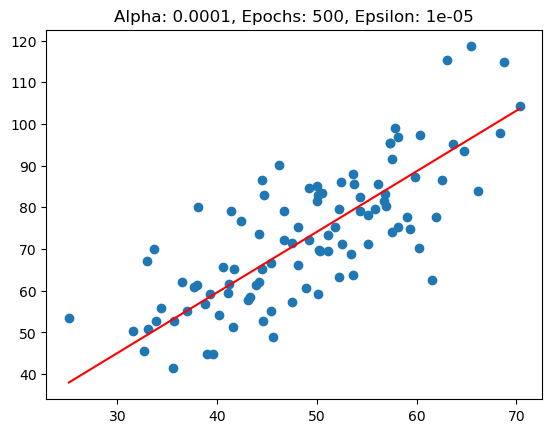

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

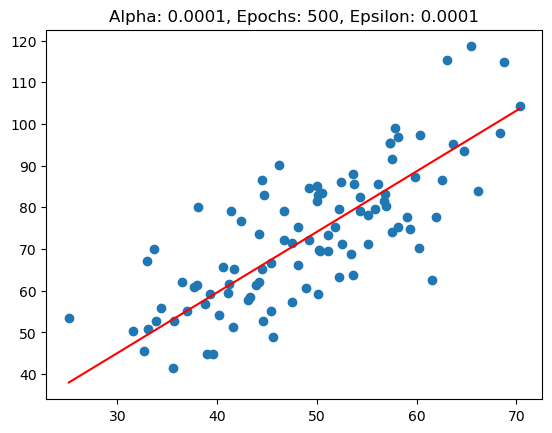

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

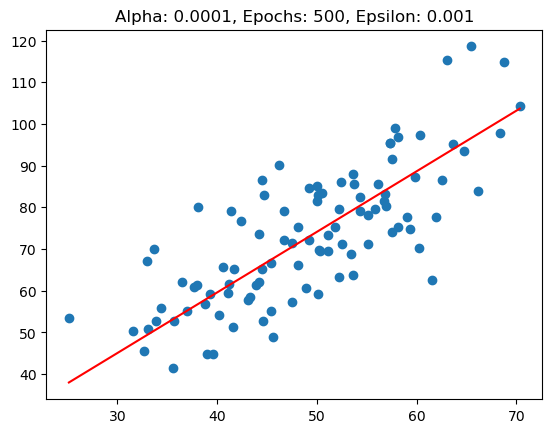

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

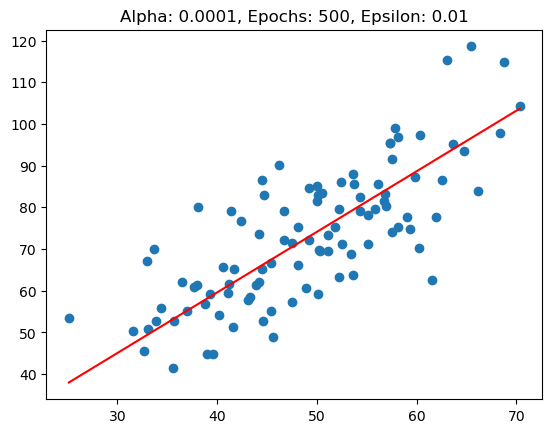

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

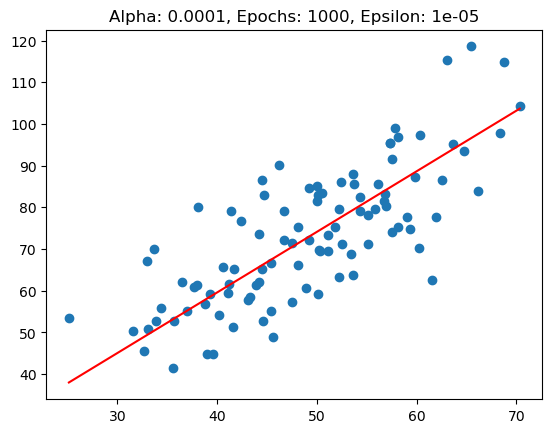

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

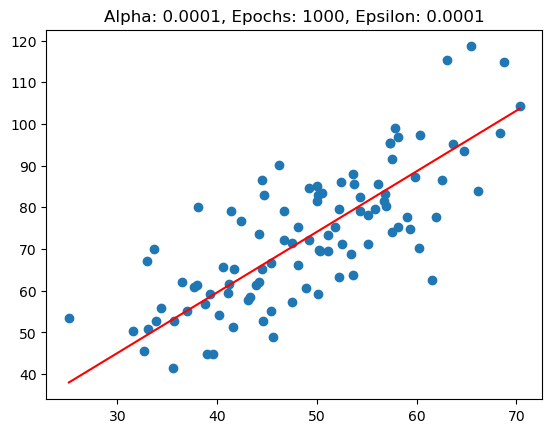

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

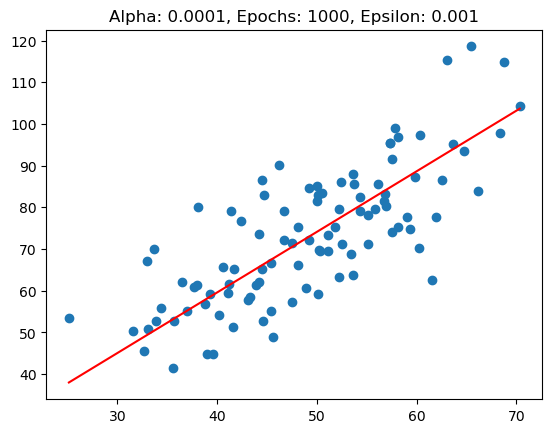

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

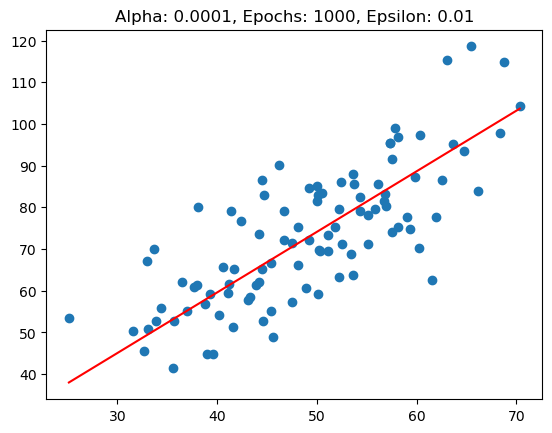

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

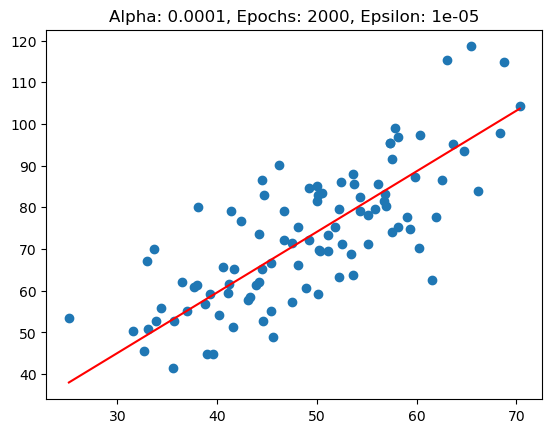

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

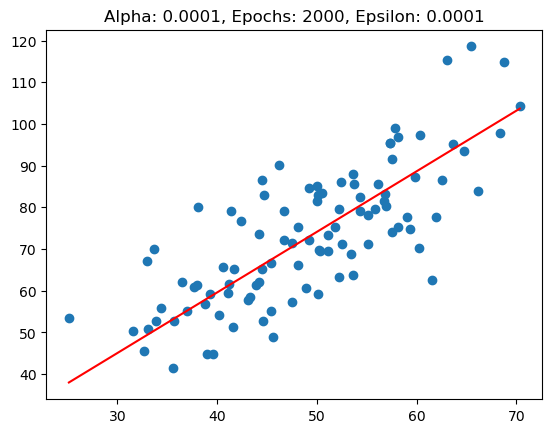

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

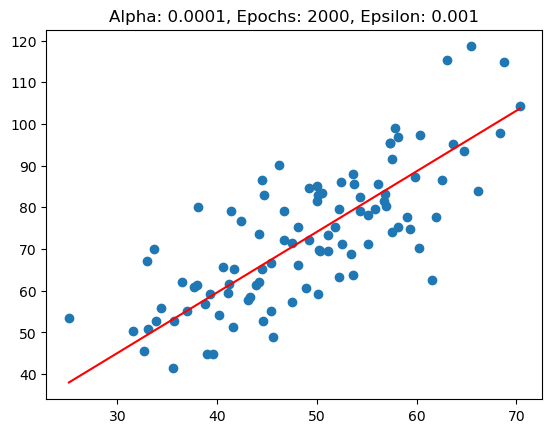

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[0.75706342]
 [0.75706342]] gradient_norm:  3626.786812573992
Epoch  2  weights:  [[1.1197421]
 [1.1197421]] gradient_norm:  1737.4479038317982
Epoch  3  weights:  [[1.2934869]
 [1.2934869]] gradient_norm:  832.341511793208
Epoch  4  weights:  [[1.37672105]
 [1.37672105]] gradient_norm:  398.7413900159571
Epoch  5  weights:  [[1.41659519]
 [1.41659519]] gradient_norm:  191.02098580823798
Epoch  6  weights:  [[1.43569728]
 [1.43569728]] gradient_norm:  91.5104825653812
Epoch  7  weights:  [[1.44484833]
 [1.44484833]] gradient_norm:  43.83899697677935
Epoch  8  weights:  [[1.44923223]
 [1.44923223]] gradient_norm:  21.001502801135832
Epoch  9  weights:  [[1.45133238]
 [1.45133238]] gradient_norm:  10.060976535108928
Epoch  10  weights:  [[1.45233848]
 [1.45233848]] gradient_norm:  4.819809791637032
Epoch  11  weights:  [[1.45282046]
 [1.45282046]] gradient_norm:  2.3089772992217896
Epoch  12  weights:

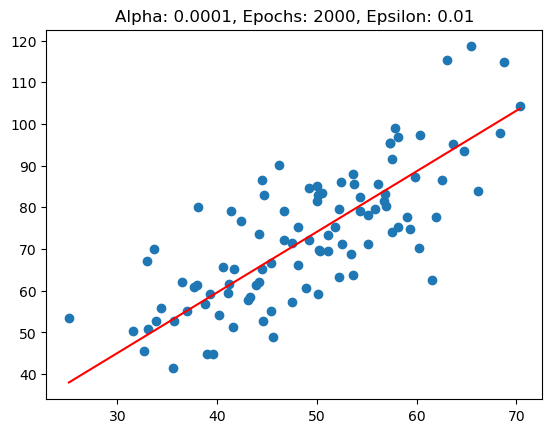

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

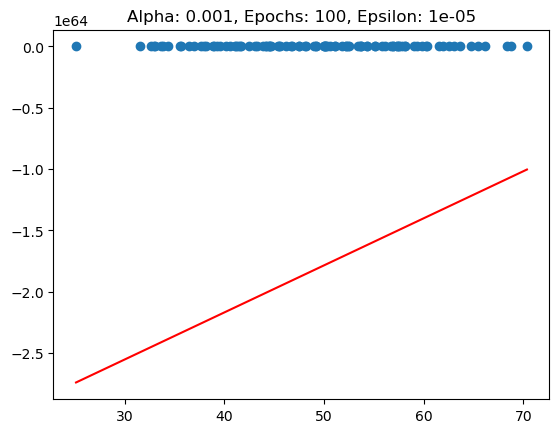

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

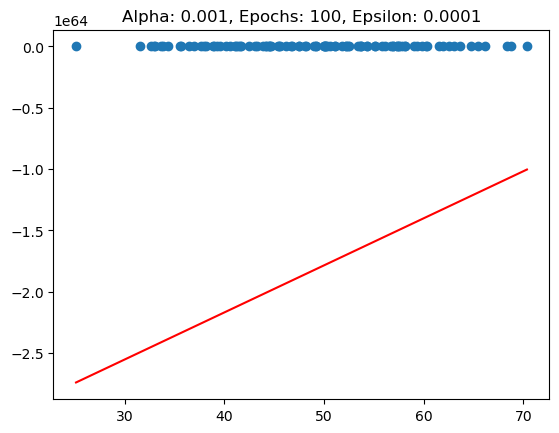

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

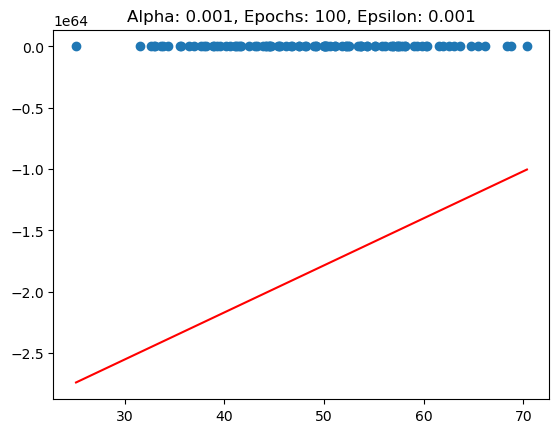

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

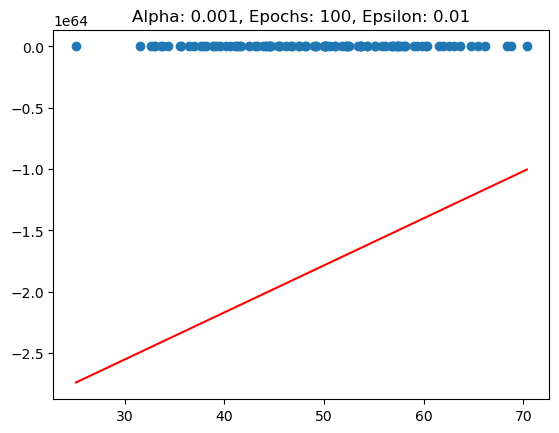

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

Epoch  197  weights:  [[1.36068016e+123]
 [1.36068016e+123]] gradient_norm:  7.088329425131304e+126
Epoch  198  weights:  [[-5.72764927e+123]
 [-5.72764927e+123]] gradient_norm:  2.983762534687818e+127
Epoch  199  weights:  [[2.41099761e+124]
 [2.41099761e+124]] gradient_norm:  1.2559854839480396e+128
Epoch  200  weights:  [[-1.01488572e+125]
 [-1.01488572e+125]] gradient_norm:  5.286947327573573e+128
Epoch  201  weights:  [[4.2720616e+125]
 [4.2720616e+125]] gradient_norm:  2.225488463184637e+129
Epoch  202  weights:  [[-1.7982823e+126]
 [-1.7982823e+126]] gradient_norm:  9.367974736455316e+129
Epoch  203  weights:  [[7.56969243e+126]
 [7.56969243e+126]] gradient_norm:  3.943356800748517e+130
Epoch  204  weights:  [[-3.18638756e+127]
 [-3.18638756e+127]] gradient_norm:  1.6599172495093068e+131
Epoch  205  weights:  [[1.34127849e+128]
 [1.34127849e+128]] gradient_norm:  6.987258354850198e+131
Epoch  206  weights:  [[-5.64597986e+128]
 [-5.64597986e+128]] gradient_norm:  2.9412176620163

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


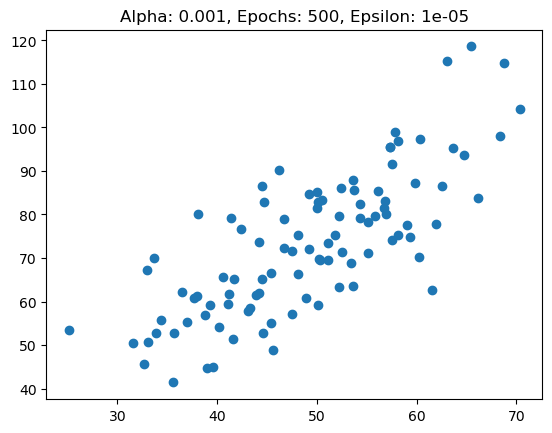

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


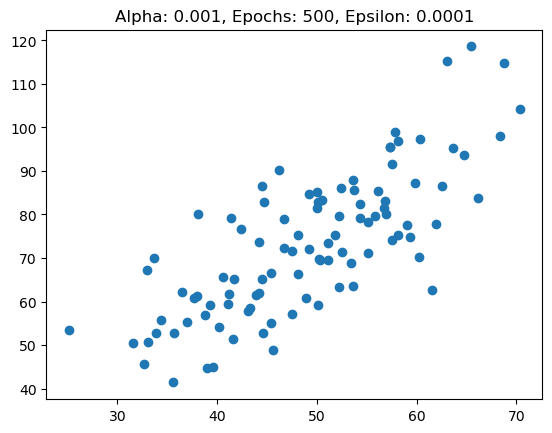

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


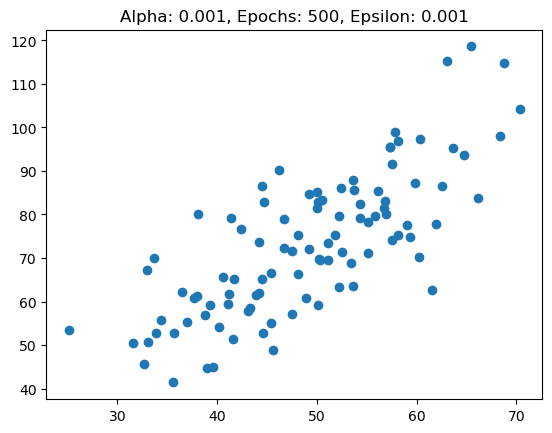

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


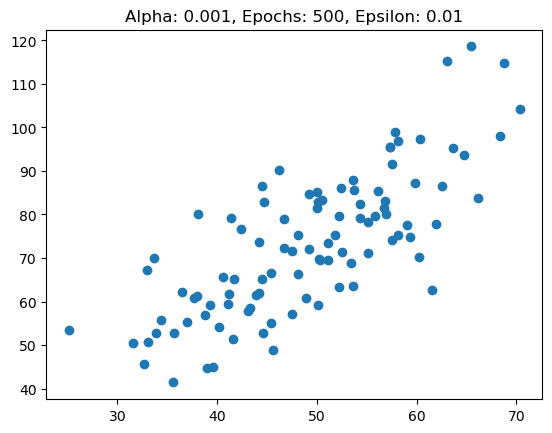

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


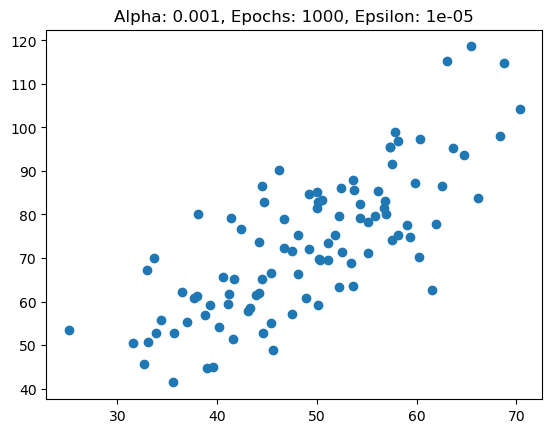

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


Epoch  475  weights:  [[4.645336e+296]
 [4.645336e+296]] gradient_norm:  inf
Epoch  476  weights:  [[-1.95540849e+297]
 [-1.95540849e+297]] gradient_norm:  inf
Epoch  477  weights:  [[8.23109965e+297]
 [8.23109965e+297]] gradient_norm:  inf
Epoch  478  weights:  [[-3.46480042e+298]
 [-3.46480042e+298]] gradient_norm:  inf
Epoch  479  weights:  [[1.45847365e+299]
 [1.45847365e+299]] gradient_norm:  inf
Epoch  480  weights:  [[-6.13930133e+299]
 [-6.13930133e+299]] gradient_norm:  inf
Epoch  481  weights:  [[2.5842785e+300]
 [2.5842785e+300]] gradient_norm:  inf
Epoch  482  weights:  [[-1.08782661e+301]
 [-1.08782661e+301]] gradient_norm:  inf
Epoch  483  weights:  [[4.57909908e+301]
 [4.57909908e+301]] gradient_norm:  inf
Epoch  484  weights:  [[-1.92752671e+302]
 [-1.92752671e+302]] gradient_norm:  inf
Epoch  485  weights:  [[8.11373404e+302]
 [8.11373404e+302]] gradient_norm:  inf
Epoch  486  weights:  [[-inf]
 [-inf]] gradient_norm:  inf
Epoch  487  weights:  [[nan]
 [nan]] gradient_

/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


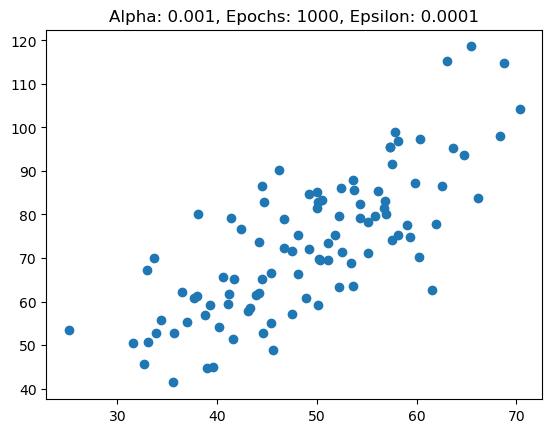

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  520  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  521  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  522  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  523  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  524  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  525  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  526  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  527  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  528  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  529  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  530  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  531  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  532  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  533  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  534  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  535  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  536  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  537  weights:  [[nan]
 [

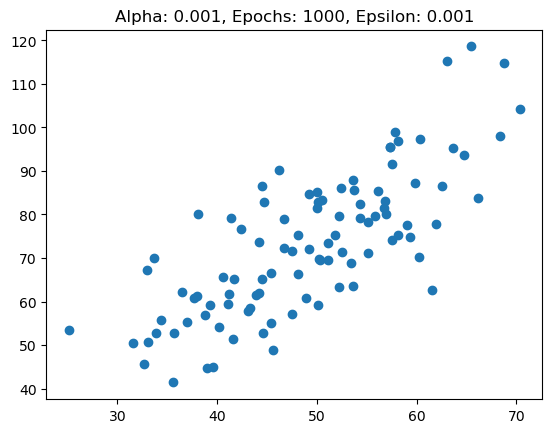

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


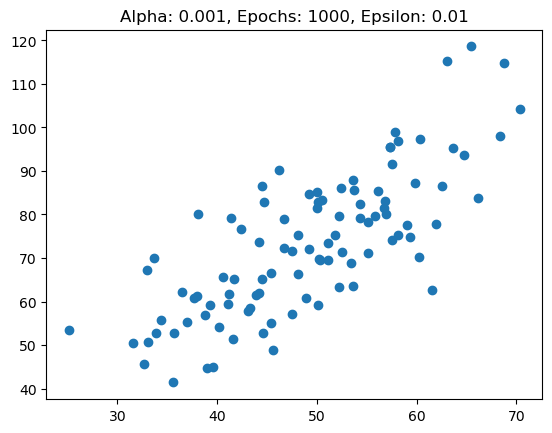

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


Epoch  374  weights:  [[-4.17599922e+233]
 [-4.17599922e+233]] gradient_norm:  inf
Epoch  375  weights:  [[1.75784579e+234]
 [1.75784579e+234]] gradient_norm:  inf
Epoch  376  weights:  [[-7.3994789e+234]
 [-7.3994789e+234]] gradient_norm:  inf
Epoch  377  weights:  [[3.11473784e+235]
 [3.11473784e+235]] gradient_norm:  inf
Epoch  378  weights:  [[-1.31111825e+236]
 [-1.31111825e+236]] gradient_norm:  inf
Epoch  379  weights:  [[5.51902329e+236]
 [5.51902329e+236]] gradient_norm:  inf
Epoch  380  weights:  [[-2.32317856e+237]
 [-2.32317856e+237]] gradient_norm:  inf
Epoch  381  weights:  [[9.77919158e+237]
 [9.77919158e+237]] gradient_norm:  inf
Epoch  382  weights:  [[-4.11645448e+238]
 [-4.11645448e+238]] gradient_norm:  inf
Epoch  383  weights:  [[1.73278102e+239]
 [1.73278102e+239]] gradient_norm:  inf
Epoch  384  weights:  [[-7.29397121e+239]
 [-7.29397121e+239]] gradient_norm:  inf
Epoch  385  weights:  [[3.07032542e+240]
 [3.07032542e+240]] gradient_norm:  inf
Epoch  386  weight

/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


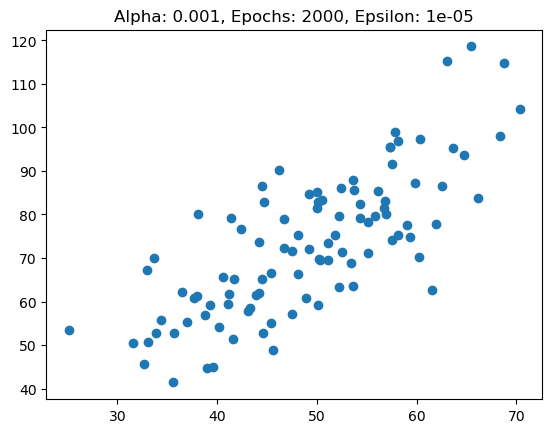

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


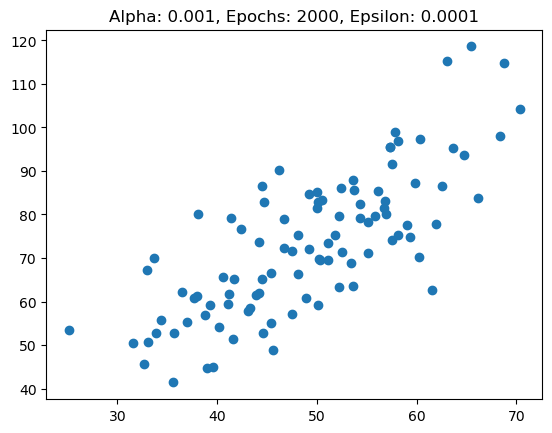

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


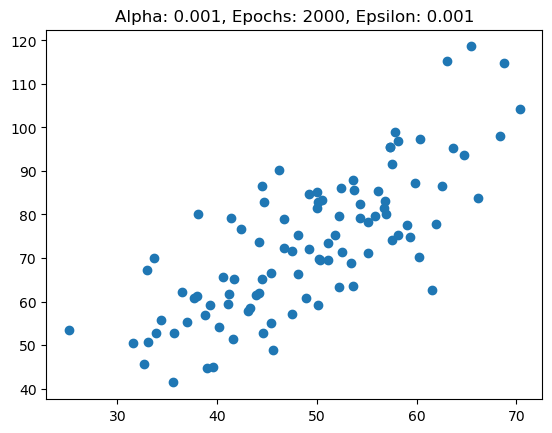

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[7.57063424]
 [7.57063424]] gradient_norm:  31867.839997458086
Epoch  2  weights:  [[-24.29720576]
 [-24.29720576]] gradient_norm:  134144.53722864325
Epoch  3  weights:  [[109.84733147]
 [109.84733147]] gradient_norm:  564668.2319768831
Epoch  4  weights:  [[-454.82090051]
 [-454.82090051]] gradient_norm:  2376915.368983184
Epoch  5  weights:  [[1922.09446847]
 [1922.09446847]] gradient_norm:  10005391.398643017
Epoch  6  weights:  [[-8083.29693017]
 [-8083.29693017]] gradient_norm:  42116710.73626176
Epoch  7  weights:  [[34033.41380609]
 [34033.41380609]] gradient_norm:  177286150.29318303
Epoch  8  weights:  [[-143252.73648709]
 [-143252.73648709]] gradient_norm:  746268607.788406
Epoch  9  weights:  [[603015.87130132]
 [603015.87130132]] gradient_norm:  3141344284.646359
Epoch  10  weights:  [[-2538328.41334504]
 [-2538328.41334504]] gradient_norm:  13223179712.63008
Epoch  11  weights:  [[1068

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


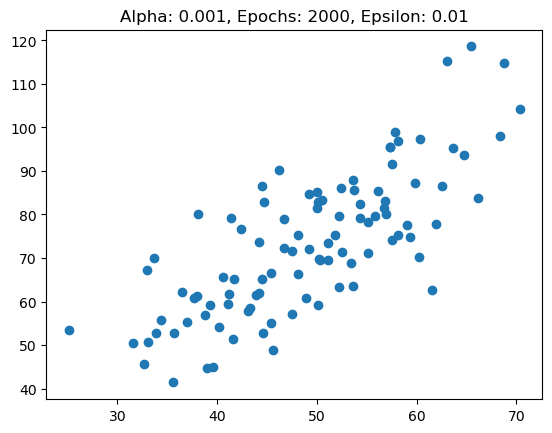

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


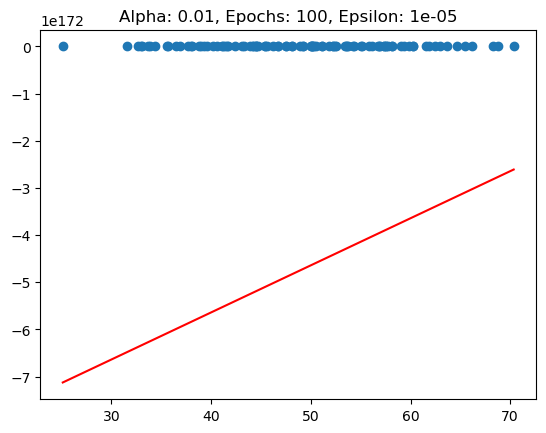

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


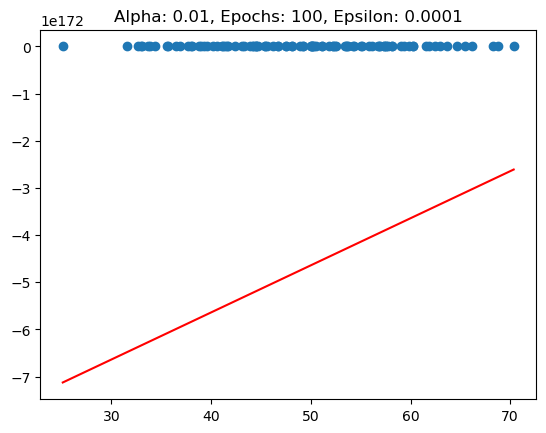

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


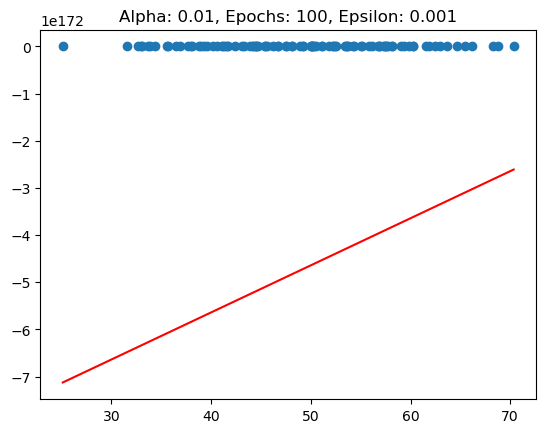

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


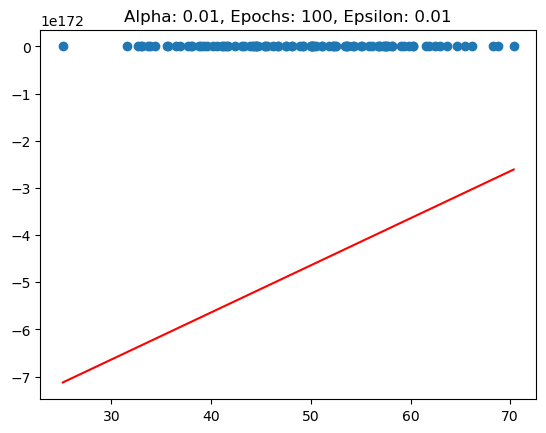

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


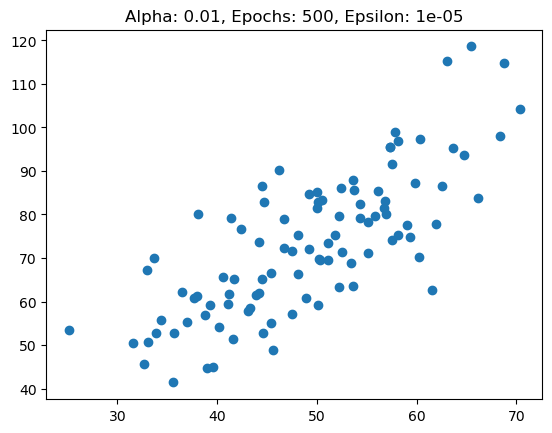

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


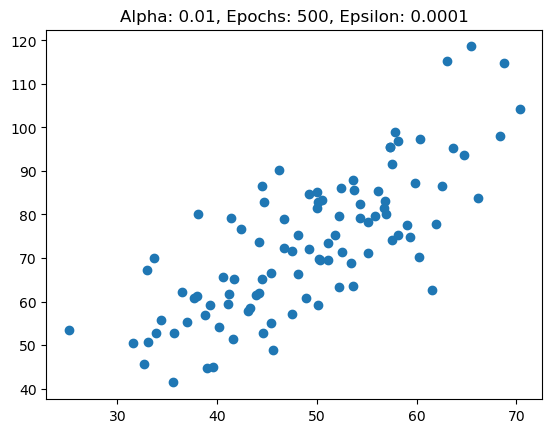

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


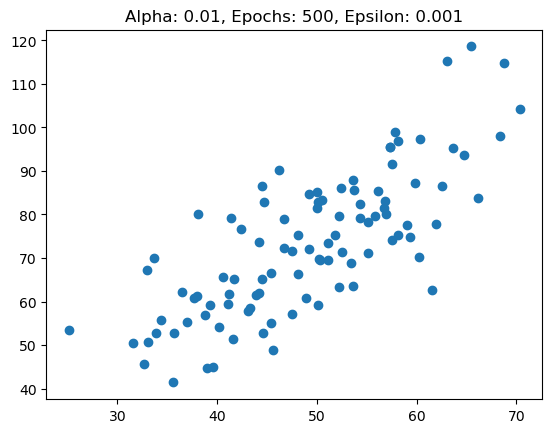

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


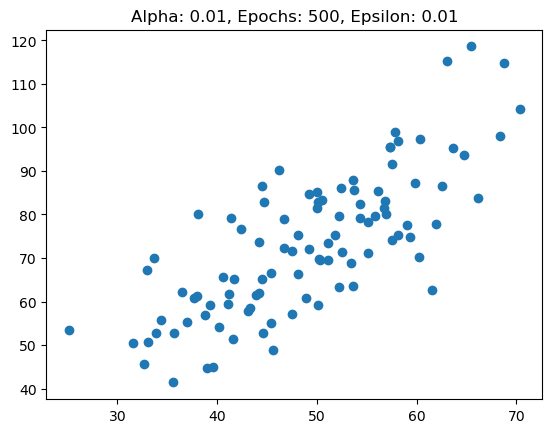

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


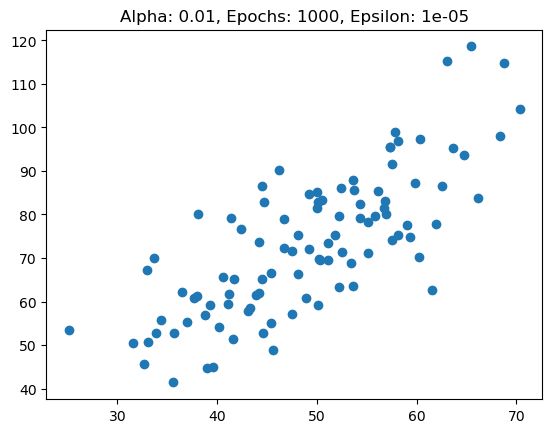

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


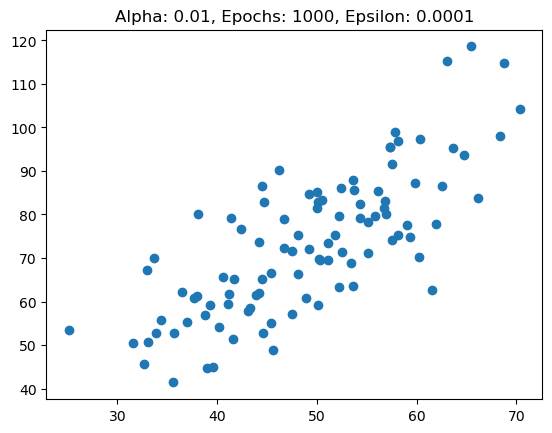

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  401  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  402  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  403  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  404  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  405  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  406  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  407  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  408  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  409  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  410  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  411  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  412  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  413  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  414  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  415  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  416  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  417  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  418  weights:  [[nan]
 [

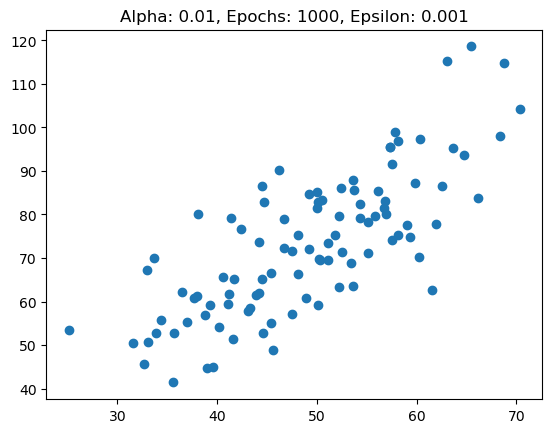

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  424  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  425  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  426  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  427  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  428  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  429  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  430  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  431  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  432  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  433  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  434  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  435  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  436  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  437  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  438  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  439  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  440  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  441  weights:  [[nan]
 [

Epoch  806  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  807  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  808  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  809  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  810  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  811  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  812  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  813  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  814  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  815  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  816  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  817  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  818  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  819  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  820  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  821  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  822  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  823  weights:  [[nan]
 [

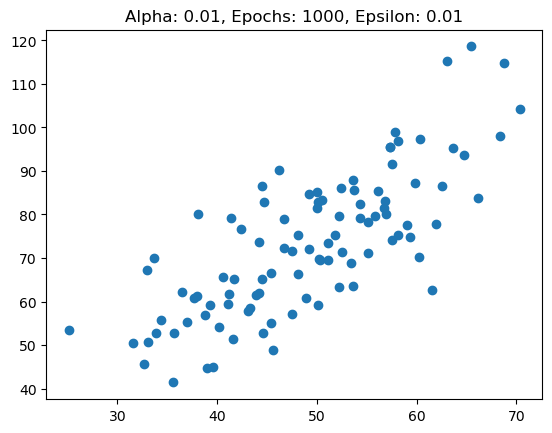

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


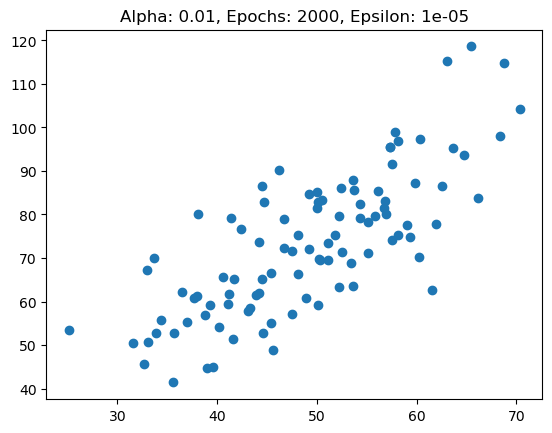

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


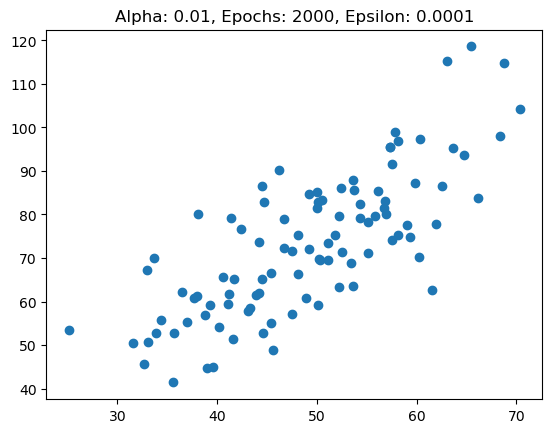

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


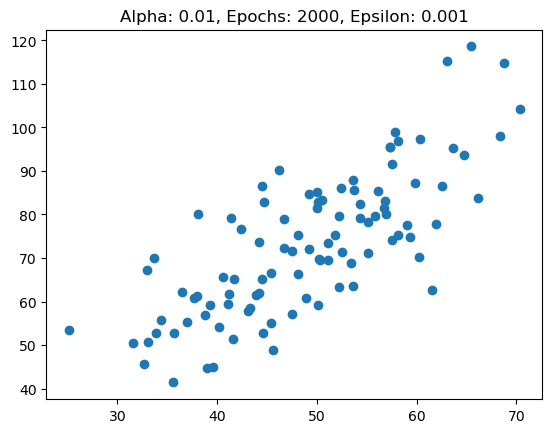

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[75.70634236]
 [75.70634236]] gradient_norm:  386814.1080977789
Epoch  2  weights:  [[-3792.43473862]
 [-3792.43473862]] gradient_norm:  19763886.295515567
Epoch  3  weights:  [[193846.42821654]
 [193846.42821654]] gradient_norm:  1009816326.0460223
Epoch  4  weights:  [[-9904316.83224369]
 [-9904316.83224369]] gradient_norm:  51595571695.8594
Epoch  5  weights:  [[5.060514e+08]
 [5.060514e+08]] gradient_norm:  2636224974739.8535
Epoch  6  weights:  [[-2.58561983e+10]
 [-2.58561983e+10]] gradient_norm:  134695321497907.97
Epoch  7  weights:  [[1.32109702e+12]
 [1.32109702e+12]] gradient_norm:  6882124935188868.0
Epoch  8  weights:  [[-6.75001523e+13]
 [-6.75001523e+13]] gradient_norm:  3.516354027506739e+17
Epoch  9  weights:  [[3.44885388e+15]
 [3.44885388e+15]] gradient_norm:  1.7966464955526904e+19
Epoch  10  weights:  [[-1.76215796e+17]
 [-1.76215796e+17]] gradient_norm:  9.179788510289802e+20
E

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


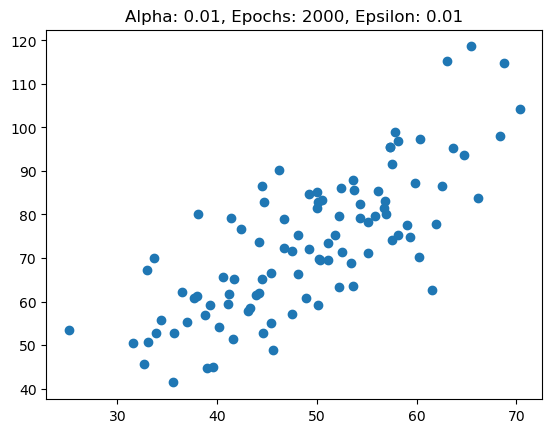

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


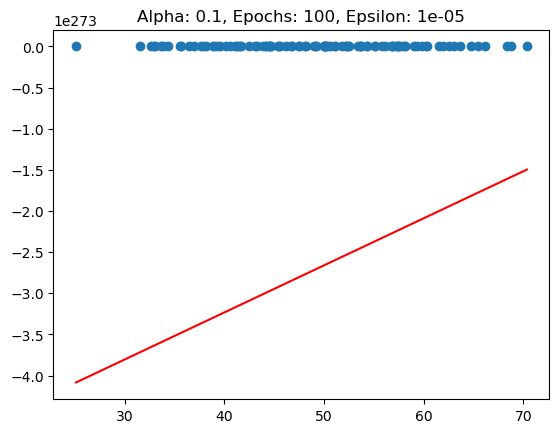

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


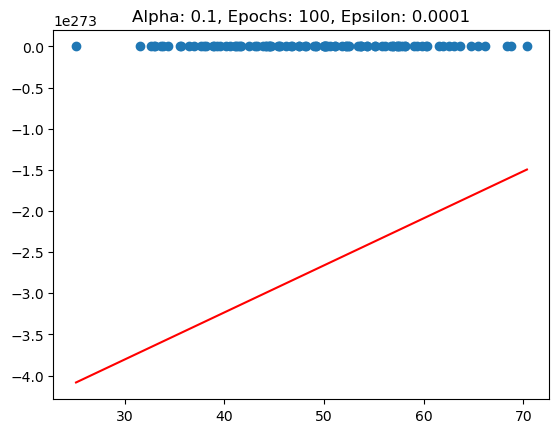

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

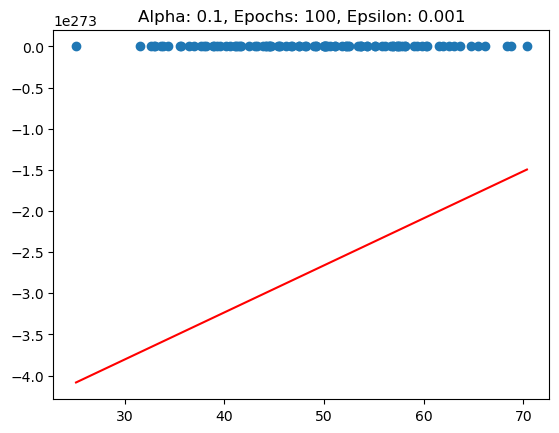

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:


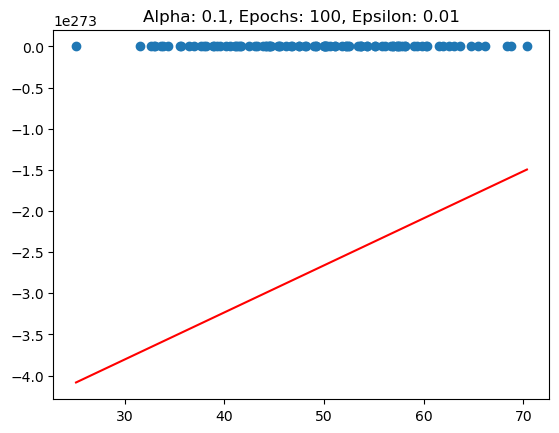

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


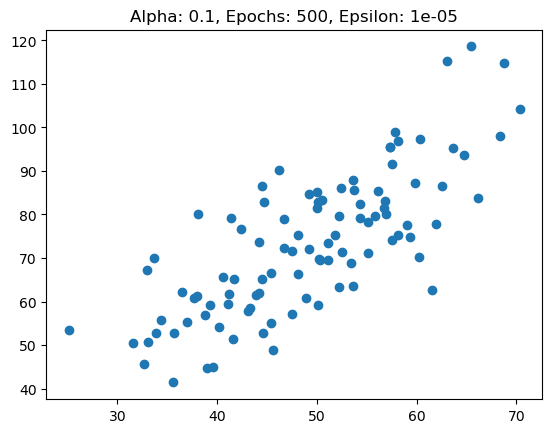

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


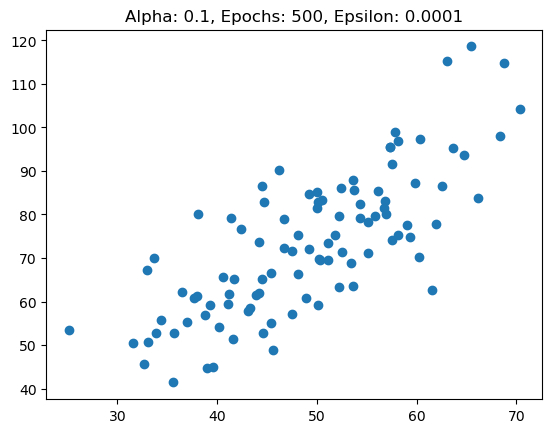

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


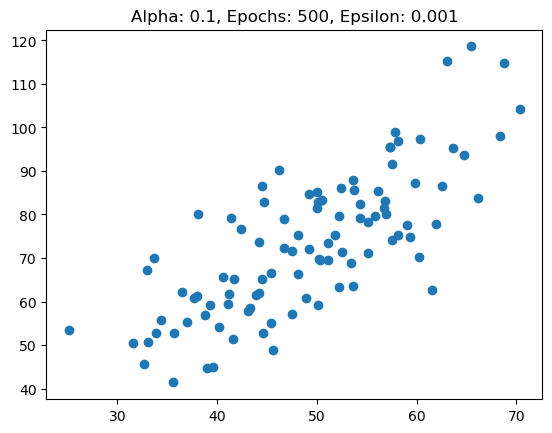

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


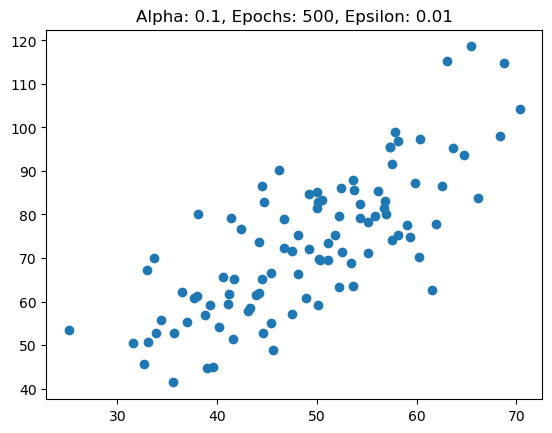

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


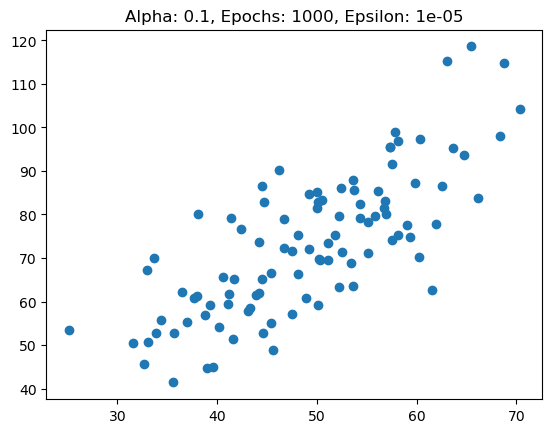

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  572  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  573  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  574  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  575  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  576  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  577  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  578  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  579  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  580  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  581  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  582  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  583  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  584  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  585  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  586  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  587  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  588  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  589  weights:  [[nan]
 [

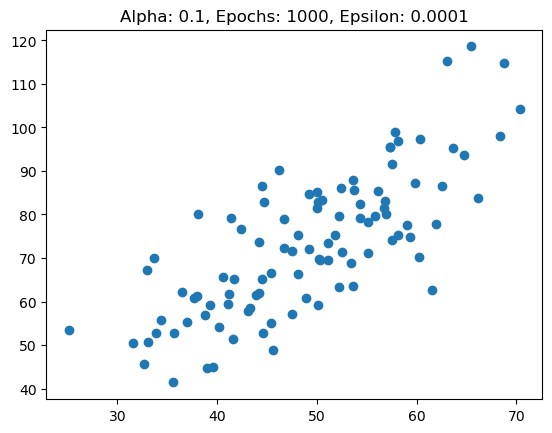

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


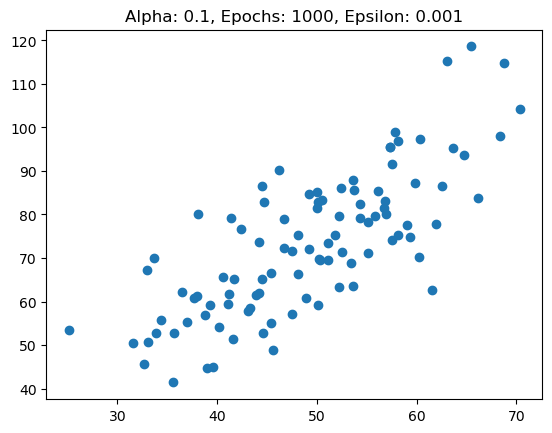

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  380  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  381  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  382  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  383  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  384  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  385  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  386  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  387  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  388  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  389  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  390  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  391  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  392  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  393  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  394  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  395  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  396  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  397  weights:  [[nan]
 [

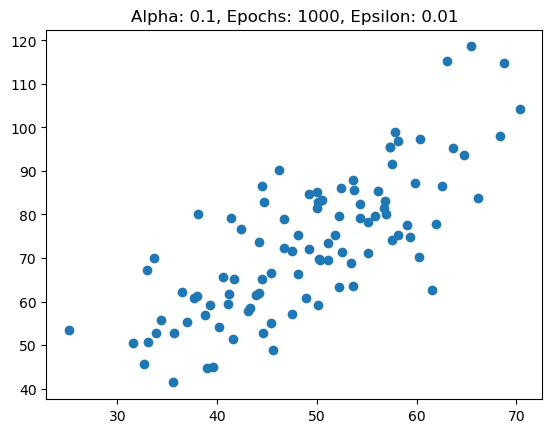

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


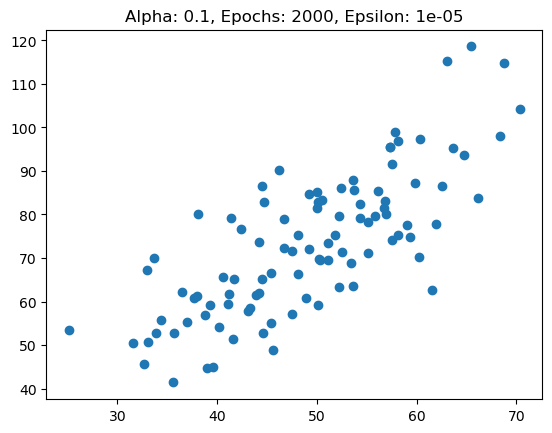

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  444  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  445  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  446  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  447  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  448  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  449  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  450  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  451  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  452  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  453  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  454  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  455  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  456  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  457  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  458  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  459  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  460  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  461  weights:  [[nan]
 [

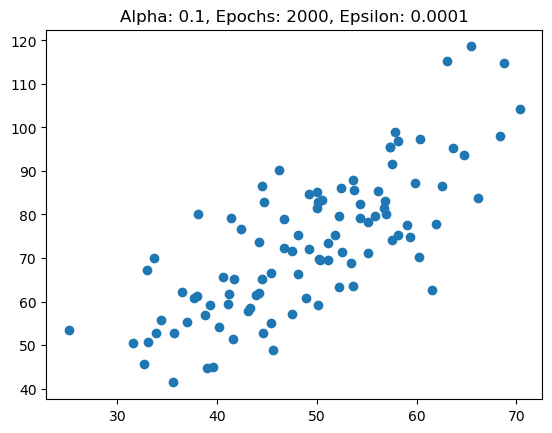

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  249  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  250  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  251  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  252  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  253  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  254  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  255  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  256  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  257  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  258  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  259  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  260  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  261  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  262  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  263  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  264  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  265  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  266  weights:  [[nan]
 [

Epoch  475  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  476  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  477  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  478  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  479  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  480  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  481  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  482  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  483  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  484  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  485  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  486  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  487  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  488  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  489  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  490  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  491  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  492  weights:  [[nan]
 [

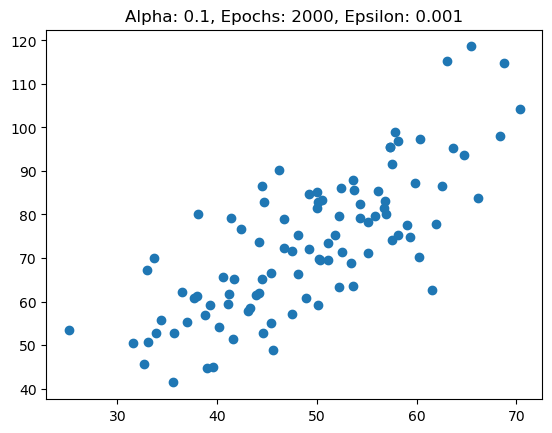

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[757.06342359]
 [757.06342359]] gradient_norm:  3936276.789100987
Epoch  2  weights:  [[-392870.61548651]
 [-392870.61548651]] gradient_norm:  2046628390.382265
Epoch  3  weights:  [[2.04269968e+08]
 [2.04269968e+08]] gradient_norm:  1064124296318.9496
Epoch  4  weights:  [[-1.0620816e+11]
 [-1.0620816e+11]] gradient_norm:  553280958740536.06
Epoch  5  weights:  [[5.52218877e+13]
 [5.52218877e+13]] gradient_norm:  2.876729911757353e+17
Epoch  6  weights:  [[-2.87120772e+16]
 [-2.87120772e+16]] gradient_norm:  1.495727415604111e+20
Epoch  7  weights:  [[1.49285621e+19]
 [1.49285621e+19]] gradient_norm:  7.77688754389556e+22
Epoch  8  weights:  [[-7.76195898e+21]
 [-7.76195898e+21]] gradient_norm:  4.04351616741414e+25
Epoch  9  weights:  [[4.03575421e+24]
 [4.03575421e+24]] gradient_norm:  2.1023864500874036e+28
Epoch  10  weights:  [[-2.0983507e+27]
 [-2.0983507e+27]] gradient_norm:  1.0931151509004

Epoch  426  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  427  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  428  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  429  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  430  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  431  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  432  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  433  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  434  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  435  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  436  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  437  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  438  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  439  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  440  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  441  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  442  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  443  weights:  [[nan]
 [

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


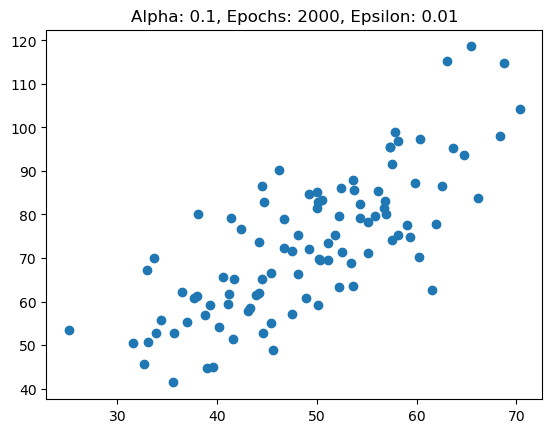

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


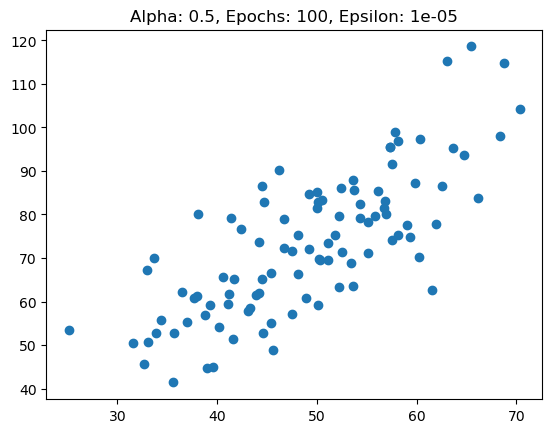

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


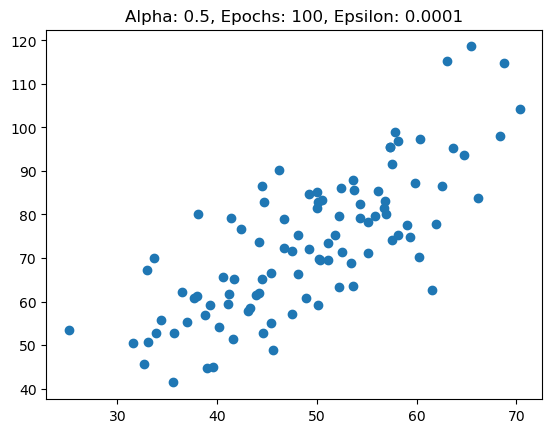

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


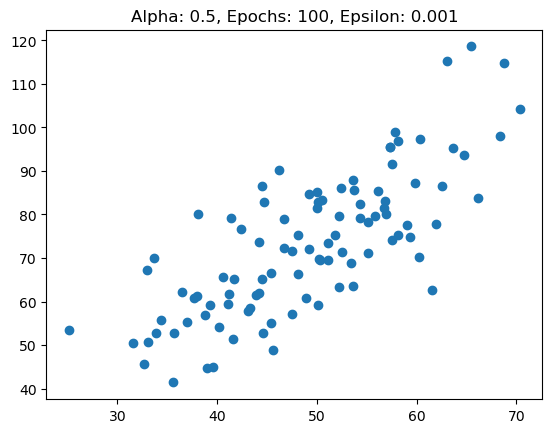

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


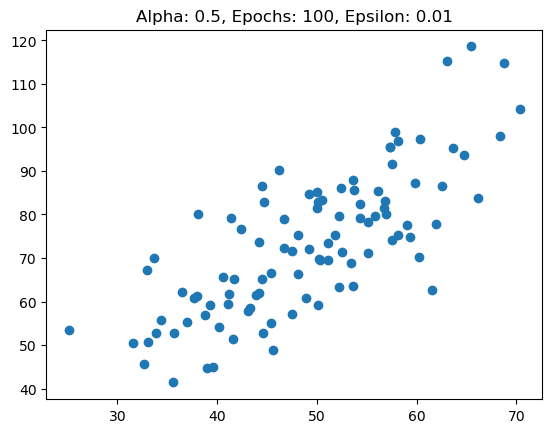

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


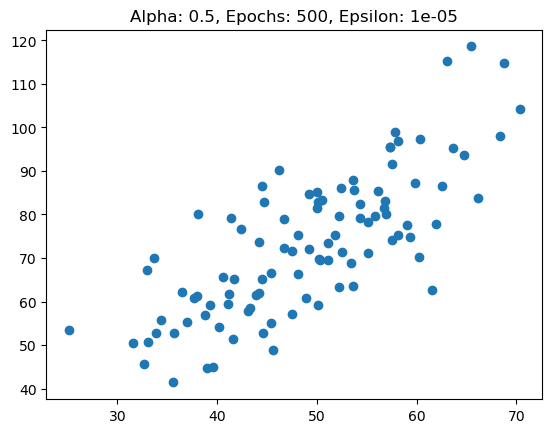

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


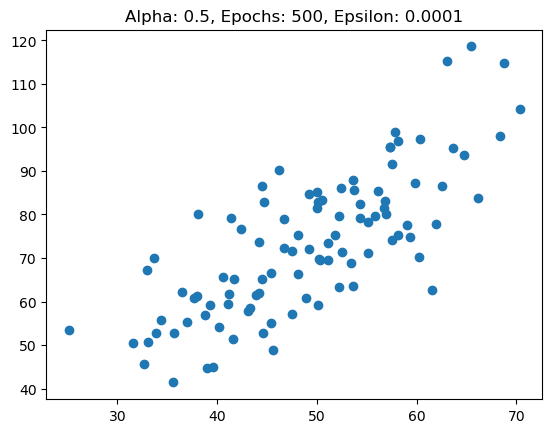

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


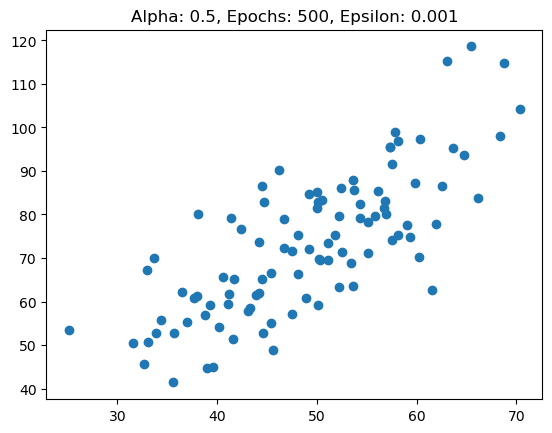

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


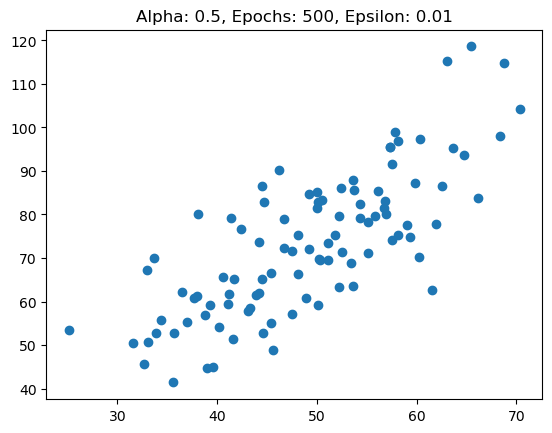

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


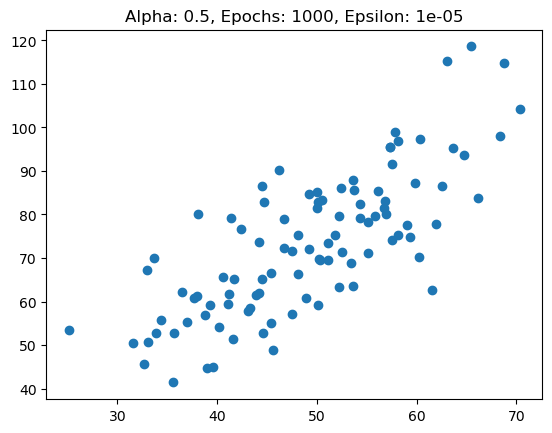

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  558  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  559  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  560  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  561  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  562  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  563  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  564  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  565  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  566  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  567  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  568  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  569  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  570  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  571  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  572  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  573  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  574  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  575  weights:  [[nan]
 [

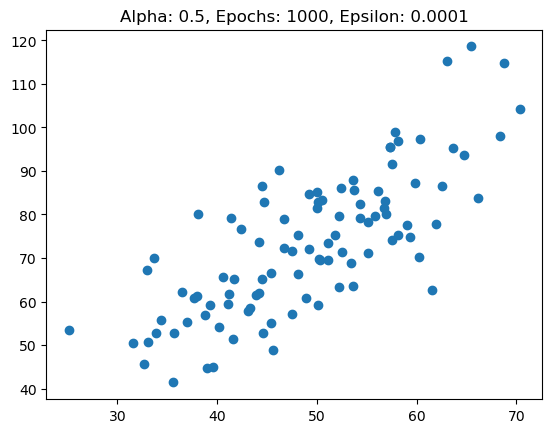

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  834  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  835  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  836  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  837  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  838  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  839  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  840  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  841  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  842  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  843  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  844  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  845  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  846  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  847  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  848  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  849  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  850  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  851  weights:  [[nan]
 [

Epoch  978  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  979  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  980  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  981  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  982  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  983  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  984  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  985  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  986  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  987  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  988  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  989  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  990  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  991  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  992  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  993  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  994  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  995  weights:  [[nan]
 [

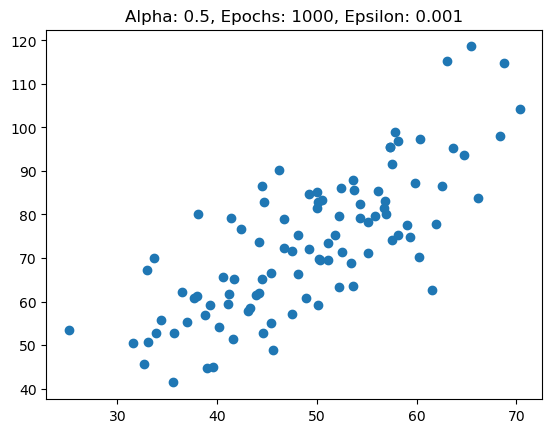

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


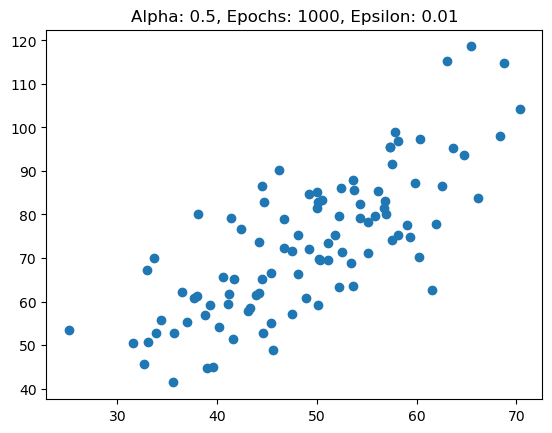

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  1026  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1027  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1028  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1029  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1030  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1031  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1032  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1033  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1034  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1035  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1036  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1037  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1038  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1039  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1040  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1041  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1042  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1043  w

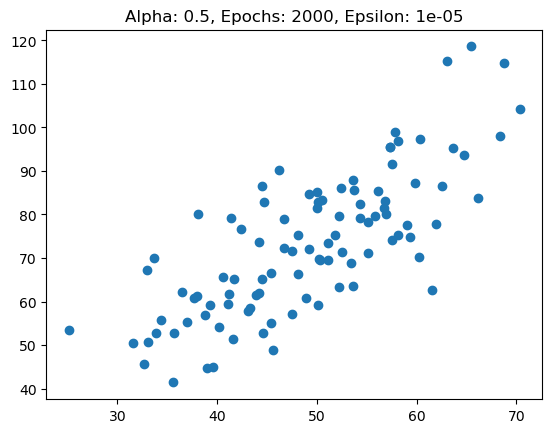

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


Epoch  581  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  582  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  583  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  584  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  585  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  586  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  587  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  588  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  589  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  590  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  591  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  592  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  593  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  594  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  595  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  596  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  597  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  598  weights:  [[nan]
 [

Epoch  1036  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1037  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1038  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1039  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1040  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1041  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1042  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1043  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1044  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1045  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1046  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1047  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1048  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1049  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1050  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1051  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1052  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  1053  w

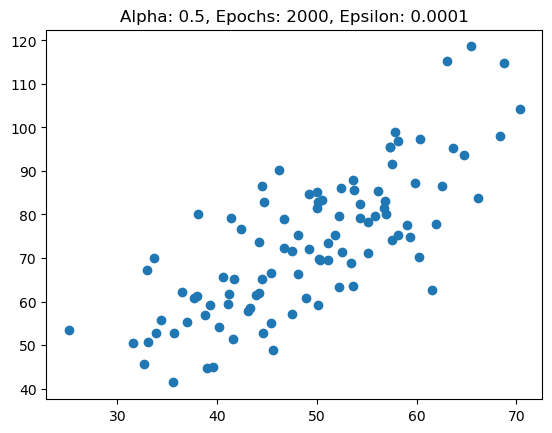

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

Epoch  550  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  551  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  552  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  553  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  554  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  555  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  556  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  557  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  558  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  559  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  560  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  561  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  562  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  563  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  564  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  565  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  566  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  567  weights:  [[nan]
 [

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


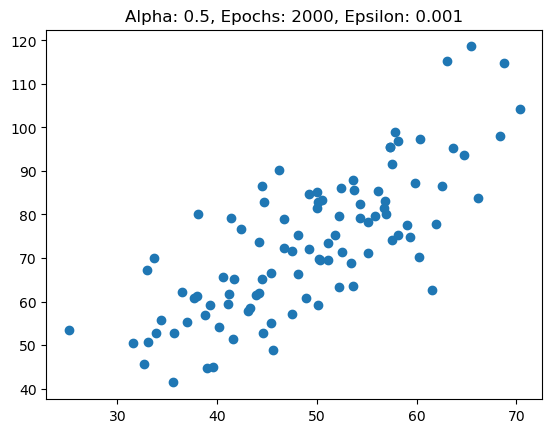

Epoch  0  weights:  [[0.]
 [0.]] gradient_norm:  7570.634235910889
Epoch  1  weights:  [[3785.31711796]
 [3785.31711796]] gradient_norm:  19711666.482448578
Epoch  2  weights:  [[-9852047.92410633]
 [-9852047.92410633]] gradient_norm:  51323281961.26843
Epoch  3  weights:  [[2.56517889e+10]
 [2.56517889e+10]] gradient_norm:  133630470747933.33
Epoch  4  weights:  [[-6.67895836e+13]
 [-6.67895836e+13]] gradient_norm:  3.479337647539821e+17
Epoch  5  weights:  [[1.73900093e+17]
 [1.73900093e+17]] gradient_norm:  9.059154246656097e+20
Epoch  6  weights:  [[-4.52783812e+20]
 [-4.52783812e+20]] gradient_norm:  2.3587327238198984e+24
Epoch  7  weights:  [[1.17891358e+24]
 [1.17891358e+24]] gradient_norm:  6.14143430052808e+27
Epoch  8  weights:  [[-3.06953824e+27]
 [-3.06953824e+27]] gradient_norm:  1.5990457454891668e+31
Epoch  9  weights:  [[7.99215919e+30]
 [7.99215919e+30]] gradient_norm:  4.1634367006859335e+34
Epoch  10  weights:  [[-2.08091913e+34]
 [-2.08091913e+34]] gradient_norm:  

Epoch  224  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  225  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  226  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  227  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  228  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  229  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  230  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  231  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  232  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  233  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  234  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  235  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  236  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  237  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  238  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  239  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  240  weights:  [[nan]
 [nan]] gradient_norm:  nan
Epoch  241  weights:  [[nan]
 [

/tmp/ipykernel_1531/3824743886.py:35: RuntimeWarning: invalid value encountered in scalar subtract
  if np.abs(gradient_norm - prev_gradient) <= epsilon:
/home/nj/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_1531/3824743886.py:39: RuntimeWarning: invalid value encountered in subtract
  weights = weights - alpha * gradient


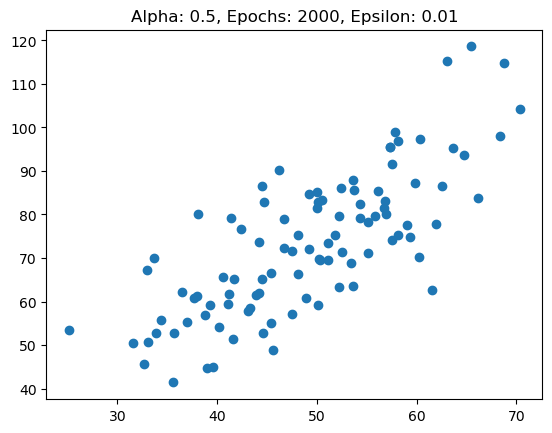

In [6]:
# Your code and answer here
# Define a list of learning rates to test
alphas = [0.0001, 0.001, 0.01, 0.1, 0.5]

# Define a list of epochs to test
epochs = [100, 500, 1000, 2000]

# Define a stopping criterion to test
epsilons = [0.00001, 0.0001, 0.001, 0.01]

# For each combination of learning rate, number of epochs, and stopping criterion
for alphax in alphas:
   for epochx in epochs:
       for epsilonx in epsilons:
           # Run the gradient descent algorithm
           weightsx = gradient_descent(alphax, epochx, epsilonx, X, y)
           
           # Calculate the predicted values
           y_hatx = np.dot(PolynomialFeatures(1).fit_transform(X), weightsx)
           
           # Plot the predicted vs actual values
           plt.scatter(X, y)
           plt.plot([min(X), max(X)], [min(y_hatx), max(y_hatx)], color='red') # predicted
           plt.title(f'Alpha: {alphax}, Epochs: {epochx}, Epsilon: {epsilonx}')
           plt.show()

The learning rate (`alpha`), the number of `epochs`, and the stopping criterion (`epsilon`) are all parameters that can significantly influence the performance of a gradient descent algorithm.

1. **Learning Rate (`alpha`)**: Controls how quickly the model learns and converges. Too small - slow convergence. Too large - may overshoot minimum and fail to converge. From our tests we can see that an `alpha` value >= 0.001 causes a failure to coverge when other parameters stay the same.

2. **Number of Epochs (`epochs`)**: An epoch is one pass through all the training data. More epochs allow model to learn better but risk overfitting. In our tests the stopping criterion takes precedence and stops the training before higher epoch values.

3. **Stopping Criterion (`epsilon`)**: The stopping criterion is a threshold for the change in the gradient norm. If the change in the gradient norm from the previous iteration to the current iteration is less than or equal to `epsilon`, the iterations are stopped. Stopping too early may result in an underfitted model, while stopping too late may lead to overfitting.


### Exercise 3: Comparison with closed form solution
Use your code from lab 1 or the demo used in the course to implement the closed form solution for linear regression.

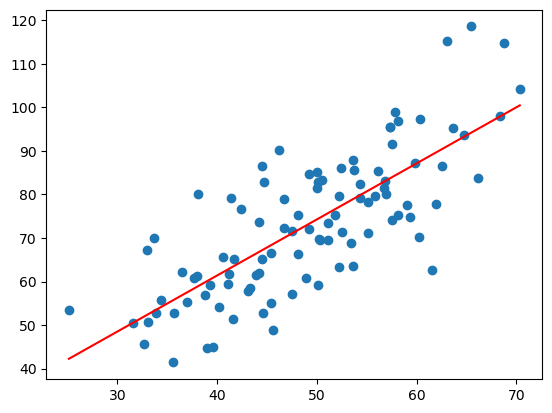

In [7]:
def closed_form_linreg(X, y):
    '''
    Computes the closed-form solution for linear regression
    Inputs:
    X - Input matrix of size N x D
    y - Output vector of size N x 1

    Outputs:
    theta - Parameters vector of size D x 1
    '''
    # Add a column of ones to X for the bias term
    X = np.hstack([np.ones((X.shape[0], 1)), X])
    
    # Compute the closed-form solution
    theta = np.linalg.inv(X.T @ X) @ X.T @ y
    
    return theta

weights2 = closed_form_linreg(X, y)
y_hat2 = np.dot(PolynomialFeatures(1).fit_transform(X),weights2)
plt.scatter(X, Y)
plt.plot([min(X), max(X)], [min(y_hat2), max(y_hat2)], color='red') # predicted
plt.show()

### Question 2: Comparison
What are the differences between the results obtained with gradient descent and with the closed form solution.

In [8]:
# Calculate MSEs for gradient descent and the closed form solution
mse_grad = np.mean((y_hat - y)**2)
mse_cfs = np.mean((y_hat2 - y)**2)
print("MSE for gradient descent is", mse_grad, "and MSE for closed form solution is", mse_cfs)

MSE for gradient descent is 110.10221757392833 and MSE for closed form solution is 107.47043700950907


Using gradient descent was a slower process and we got a higher MSE than using the closed form solution. However, for most non-linear regression problems there is no closed form solution. For our data closed form solution was more applicable but with high-dimensional, noisy data or data with a large number of training examples, gradient descent may be more appropriate. 

### Bonus
Implement gradient descent using mini-batch and stochastic gradient descent.

In [9]:
def mini_batch_gradient_descent(alpha, epochs, epsilon, X, y, batch_size):
    '''
    Performs mini-batch gradient descent
    Inputs:
    alpha - learning rate
    epochs - number of iterations
    epsilon - threshold to stop iterations
    X - Input matrix of size N x (D + 1)
    y - Output vector of size N x 1
    batch_size - size of the mini-batch

    Outputs:
    weights - Parameters vector of size (D + 1) x 1
    '''
  
    #Initialize weights
    weights = np.zeros((X.shape[1]+1,1))
    
    #Adds a one to the matrix so it copes with w_0
    X = PolynomialFeatures(1).fit_transform(X)
    N = len(X)
    inv_N = float(1/N)
    prev_gradient = 0
    num_batches = int(np.ceil(N / batch_size))  # Number of mini-batches

    for e in range(epochs):
        for b in range(num_batches):
            # Select the indices for the current mini-batch
            batch_indices = np.arange(b*batch_size, min((b+1)*batch_size, N))
            X_batch = X[batch_indices]
            y_batch = y[batch_indices]

            #1) Estimate y_hat
            y_hat = np.dot(X_batch,weights)
        
            #2) Estimate the gradient
            gradient = -2 * inv_N * np.sum((X_batch * (y_batch - y_hat)))
            gradient_norm = np.linalg.norm(gradient)
        
            print ('Epoch ', e, ' Batch ', b, ' weights: ', weights, 'gradient_norm: ', gradient_norm) 
        
            #3) Check the stopping criterion
            if np.abs(gradient_norm - prev_gradient) <= epsilon:
                break
            
            #4) Update weights
            weights = weights - alpha * gradient
            #5) Update previous gradient
            prev_gradient = gradient_norm
        
    return weights

In [10]:
alpha_b = 0.0001  # The learning Rate
epochs_b = 1000  # The number of iterations to perform gradient descent

Epoch  0  Batch  0  weights:  [[0.]
 [0.]] gradient_norm:  4807.450083459179
Epoch  0  Batch  1  weights:  [[0.48074501]
 [0.48074501]] gradient_norm:  1865.966440464939
Epoch  1  Batch  0  weights:  [[0.66734165]
 [0.66734165]] gradient_norm:  2576.46371088594
Epoch  1  Batch  1  weights:  [[0.92498802]
 [0.92498802]] gradient_norm:  1036.872649190853
Epoch  2  Batch  0  weights:  [[1.02867529]
 [1.02867529]] gradient_norm:  1368.4911304310817
Epoch  2  Batch  1  weights:  [[1.1655244]
 [1.1655244]] gradient_norm:  587.9579544187397
Epoch  3  Batch  0  weights:  [[1.2243202]
 [1.2243202]] gradient_norm:  714.4316645959216
Epoch  3  Batch  1  weights:  [[1.29576336]
 [1.29576336]] gradient_norm:  344.89208502819315
Epoch  4  Batch  0  weights:  [[1.33025257]
 [1.33025257]] gradient_norm:  360.2896983209183
Epoch  4  Batch  1  weights:  [[1.36628154]
 [1.36628154]] gradient_norm:  213.28352431361458
Epoch  5  Batch  0  weights:  [[1.38760989]
 [1.38760989]] gradient_norm:  168.538735559

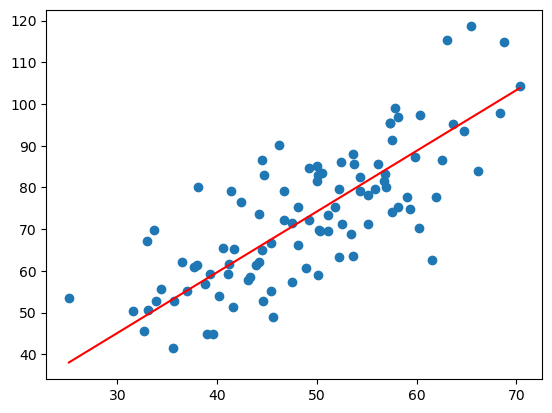

In [11]:
weights_b1 = mini_batch_gradient_descent(alpha_b, epochs_b, 0.00001, X, y, 64)
y_hat_b1 = np.dot(PolynomialFeatures(1).fit_transform(X),weights_b1)
plt.scatter(X, Y)
plt.plot([min(X), max(X)], [min(y_hat_b1), max(y_hat_b1)], color='red') # predicted
plt.show()

Epoch  0  Batch  0  weights:  [[0.]
 [0.]] gradient_norm:  75.62312602772576
Epoch  0  Batch  1  weights:  [[0.00756231]
 [0.00756231]] gradient_norm:  78.43392275440861
Epoch  0  Batch  2  weights:  [[0.0154057]
 [0.0154057]] gradient_norm:  69.33468860179774
Epoch  0  Batch  3  weights:  [[0.02233917]
 [0.02233917]] gradient_norm:  105.49851752056257
Epoch  0  Batch  4  weights:  [[0.03288903]
 [0.03288903]] gradient_norm:  86.6121491904829
Epoch  0  Batch  5  weights:  [[0.04155024]
 [0.04155024]] gradient_norm:  83.23723570424492
Epoch  0  Batch  6  weights:  [[0.04987396]
 [0.04987396]] gradient_norm:  46.53711749453333
Epoch  0  Batch  7  weights:  [[0.05452768]
 [0.05452768]] gradient_norm:  72.07395818275869
Epoch  0  Batch  8  weights:  [[0.06173507]
 [0.06173507]] gradient_norm:  73.55821023676532
Epoch  0  Batch  9  weights:  [[0.06909089]
 [0.06909089]] gradient_norm:  48.72524018039329
Epoch  0  Batch  10  weights:  [[0.07396342]
 [0.07396342]] gradient_norm:  87.651103792

Epoch  2  Batch  98  weights:  [[1.15443118]
 [1.15443118]] gradient_norm:  12.29403620852582
Epoch  3  Batch  0  weights:  [[1.15566059]
 [1.15566059]] gradient_norm:  6.463797178047668
Epoch  3  Batch  1  weights:  [[1.15630697]
 [1.15630697]] gradient_norm:  12.306361533827795
Epoch  3  Batch  2  weights:  [[1.15507633]
 [1.15507633]] gradient_norm:  15.231700353574604
Epoch  3  Batch  3  weights:  [[1.1565995]
 [1.1565995]] gradient_norm:  20.75560827692464
Epoch  3  Batch  4  weights:  [[1.15867506]
 [1.15867506]] gradient_norm:  14.926976826684678
Epoch  3  Batch  5  weights:  [[1.16016776]
 [1.16016776]] gradient_norm:  19.25015976287943
Epoch  3  Batch  6  weights:  [[1.16209278]
 [1.16209278]] gradient_norm:  10.046115312607743
Epoch  3  Batch  7  weights:  [[1.16309739]
 [1.16309739]] gradient_norm:  18.071941557895528
Epoch  3  Batch  8  weights:  [[1.16490458]
 [1.16490458]] gradient_norm:  9.65006168391246
Epoch  3  Batch  9  weights:  [[1.16586959]
 [1.16586959]] gradient

Epoch  28  Batch  87  weights:  [[1.45173727]
 [1.45173727]] gradient_norm:  7.354437509296735
Epoch  28  Batch  88  weights:  [[1.45247272]
 [1.45247272]] gradient_norm:  3.713399205441497
Epoch  28  Batch  89  weights:  [[1.45284406]
 [1.45284406]] gradient_norm:  12.246295088147969
Epoch  28  Batch  90  weights:  [[1.45406869]
 [1.45406869]] gradient_norm:  6.787069656001286
Epoch  28  Batch  91  weights:  [[1.45474739]
 [1.45474739]] gradient_norm:  18.833014959621156
Epoch  28  Batch  92  weights:  [[1.45663069]
 [1.45663069]] gradient_norm:  20.347955795408424
Epoch  28  Batch  93  weights:  [[1.45866549]
 [1.45866549]] gradient_norm:  4.472763004730837
Epoch  28  Batch  94  weights:  [[1.45821821]
 [1.45821821]] gradient_norm:  7.344078253212835
Epoch  28  Batch  95  weights:  [[1.45895262]
 [1.45895262]] gradient_norm:  1.203323474809839
Epoch  28  Batch  96  weights:  [[1.45883229]
 [1.45883229]] gradient_norm:  11.1089193134433
Epoch  28  Batch  97  weights:  [[1.45994318]
 [

Epoch  60  Batch  3  weights:  [[1.45550264]
 [1.45550264]] gradient_norm:  1.5760564763934628
Epoch  60  Batch  4  weights:  [[1.45534503]
 [1.45534503]] gradient_norm:  3.963680235957365
Epoch  60  Batch  5  weights:  [[1.45494867]
 [1.45494867]] gradient_norm:  2.3881244466331357
Epoch  60  Batch  6  weights:  [[1.45518748]
 [1.45518748]] gradient_norm:  0.42991456480843177
Epoch  60  Batch  7  weights:  [[1.45523047]
 [1.45523047]] gradient_norm:  3.841194206487015
Epoch  60  Batch  8  weights:  [[1.45561459]
 [1.45561459]] gradient_norm:  7.191174488242014
Epoch  60  Batch  9  weights:  [[1.45489547]
 [1.45489547]] gradient_norm:  11.600410611437702
Epoch  60  Batch  10  weights:  [[1.45373543]
 [1.45373543]] gradient_norm:  2.2500875873027453
Epoch  60  Batch  11  weights:  [[1.45396044]
 [1.45396044]] gradient_norm:  3.337411562504864
Epoch  60  Batch  12  weights:  [[1.4536267]
 [1.4536267]] gradient_norm:  12.689543086164731
Epoch  60  Batch  13  weights:  [[1.45235774]
 [1.45

Epoch  89  Batch  20  weights:  [[1.44974293]
 [1.44974293]] gradient_norm:  29.92749639873506
Epoch  89  Batch  21  weights:  [[1.45273568]
 [1.45273568]] gradient_norm:  12.907325758023491
Epoch  89  Batch  22  weights:  [[1.45144495]
 [1.45144495]] gradient_norm:  8.94901939960179
Epoch  89  Batch  23  weights:  [[1.45055005]
 [1.45055005]] gradient_norm:  1.360028815891639
Epoch  89  Batch  24  weights:  [[1.45041405]
 [1.45041405]] gradient_norm:  15.607533430691525
Epoch  89  Batch  25  weights:  [[1.44885329]
 [1.44885329]] gradient_norm:  12.925280984832808
Epoch  89  Batch  26  weights:  [[1.45014582]
 [1.45014582]] gradient_norm:  1.993788119344555
Epoch  89  Batch  27  weights:  [[1.4503452]
 [1.4503452]] gradient_norm:  9.466880133385654
Epoch  89  Batch  28  weights:  [[1.45129189]
 [1.45129189]] gradient_norm:  8.965839000991108
Epoch  89  Batch  29  weights:  [[1.45218847]
 [1.45218847]] gradient_norm:  14.98065516041398
Epoch  89  Batch  30  weights:  [[1.45069041]
 [1.

Epoch  115  Batch  69  weights:  [[1.45327584]
 [1.45327584]] gradient_norm:  1.9968595717548139
Epoch  115  Batch  70  weights:  [[1.45347553]
 [1.45347553]] gradient_norm:  17.45387456368988
Epoch  115  Batch  71  weights:  [[1.45173014]
 [1.45173014]] gradient_norm:  2.9144173815861207
Epoch  115  Batch  72  weights:  [[1.45202158]
 [1.45202158]] gradient_norm:  5.5540156453270315
Epoch  115  Batch  73  weights:  [[1.45146618]
 [1.45146618]] gradient_norm:  1.0099227951534053
Epoch  115  Batch  74  weights:  [[1.45156717]
 [1.45156717]] gradient_norm:  18.93797204583269
Epoch  115  Batch  75  weights:  [[1.45346097]
 [1.45346097]] gradient_norm:  7.626535489575433
Epoch  115  Batch  76  weights:  [[1.45422362]
 [1.45422362]] gradient_norm:  0.055820394344706634
Epoch  115  Batch  77  weights:  [[1.45422921]
 [1.45422921]] gradient_norm:  3.509469443275431
Epoch  115  Batch  78  weights:  [[1.45387826]
 [1.45387826]] gradient_norm:  10.688704524632342
Epoch  115  Batch  79  weights: 

Epoch  139  Batch  57  weights:  [[1.45401516]
 [1.45401516]] gradient_norm:  11.912504675730466
Epoch  139  Batch  58  weights:  [[1.45520641]
 [1.45520641]] gradient_norm:  1.6239277300175394
Epoch  139  Batch  59  weights:  [[1.45504401]
 [1.45504401]] gradient_norm:  0.2619098732604038
Epoch  139  Batch  60  weights:  [[1.4550702]
 [1.4550702]] gradient_norm:  4.789997556306575
Epoch  139  Batch  61  weights:  [[1.4545912]
 [1.4545912]] gradient_norm:  9.116901492787504
Epoch  139  Batch  62  weights:  [[1.45550289]
 [1.45550289]] gradient_norm:  15.82514957886638
Epoch  139  Batch  63  weights:  [[1.45392038]
 [1.45392038]] gradient_norm:  13.66823766211633
Epoch  139  Batch  64  weights:  [[1.4552872]
 [1.4552872]] gradient_norm:  11.602758436906257
Epoch  139  Batch  65  weights:  [[1.45412693]
 [1.45412693]] gradient_norm:  2.7967703249885574
Epoch  139  Batch  66  weights:  [[1.4544066]
 [1.4544066]] gradient_norm:  12.56202823474653
Epoch  139  Batch  67  weights:  [[1.455662

Epoch  165  Batch  19  weights:  [[1.45159628]
 [1.45159628]] gradient_norm:  18.533425775242275
Epoch  165  Batch  20  weights:  [[1.44974293]
 [1.44974293]] gradient_norm:  29.92749639873506
Epoch  165  Batch  21  weights:  [[1.45273568]
 [1.45273568]] gradient_norm:  12.907325758023491
Epoch  165  Batch  22  weights:  [[1.45144495]
 [1.45144495]] gradient_norm:  8.94901939960179
Epoch  165  Batch  23  weights:  [[1.45055005]
 [1.45055005]] gradient_norm:  1.360028815891639
Epoch  165  Batch  24  weights:  [[1.45041405]
 [1.45041405]] gradient_norm:  15.607533430691525
Epoch  165  Batch  25  weights:  [[1.44885329]
 [1.44885329]] gradient_norm:  12.925280984832808
Epoch  165  Batch  26  weights:  [[1.45014582]
 [1.45014582]] gradient_norm:  1.993788119344555
Epoch  165  Batch  27  weights:  [[1.4503452]
 [1.4503452]] gradient_norm:  9.466880133385654
Epoch  165  Batch  28  weights:  [[1.45129189]
 [1.45129189]] gradient_norm:  8.965839000991108
Epoch  165  Batch  29  weights:  [[1.45

Epoch  194  Batch  9  weights:  [[1.45489547]
 [1.45489547]] gradient_norm:  11.600410611439168
Epoch  194  Batch  10  weights:  [[1.45373543]
 [1.45373543]] gradient_norm:  2.250087587300664
Epoch  194  Batch  11  weights:  [[1.45396044]
 [1.45396044]] gradient_norm:  3.337411562506238
Epoch  194  Batch  12  weights:  [[1.4536267]
 [1.4536267]] gradient_norm:  12.68954308616709
Epoch  194  Batch  13  weights:  [[1.45235774]
 [1.45235774]] gradient_norm:  2.803985970939659
Epoch  194  Batch  14  weights:  [[1.45207734]
 [1.45207734]] gradient_norm:  11.925037357928844
Epoch  194  Batch  15  weights:  [[1.45088484]
 [1.45088484]] gradient_norm:  15.326571383601317
Epoch  194  Batch  16  weights:  [[1.4524175]
 [1.4524175]] gradient_norm:  10.340780716413468
Epoch  194  Batch  17  weights:  [[1.45345158]
 [1.45345158]] gradient_norm:  17.81000580345981
Epoch  194  Batch  18  weights:  [[1.45167058]
 [1.45167058]] gradient_norm:  0.7429972997854968
Epoch  194  Batch  19  weights:  [[1.451

Epoch  222  Batch  36  weights:  [[1.44925742]
 [1.44925742]] gradient_norm:  0.9014893870059638
Epoch  222  Batch  37  weights:  [[1.44934757]
 [1.44934757]] gradient_norm:  5.949513303534952
Epoch  222  Batch  38  weights:  [[1.44994252]
 [1.44994252]] gradient_norm:  3.6978381703781027
Epoch  222  Batch  39  weights:  [[1.4503123]
 [1.4503123]] gradient_norm:  12.320146965218004
Epoch  222  Batch  40  weights:  [[1.44908029]
 [1.44908029]] gradient_norm:  5.0593796116948155
Epoch  222  Batch  41  weights:  [[1.44857435]
 [1.44857435]] gradient_norm:  9.206303679605078
Epoch  222  Batch  42  weights:  [[1.44949498]
 [1.44949498]] gradient_norm:  3.276930699490827
Epoch  222  Batch  43  weights:  [[1.44916729]
 [1.44916729]] gradient_norm:  29.09118266032052
Epoch  222  Batch  44  weights:  [[1.4520764]
 [1.4520764]] gradient_norm:  2.257822393620912
Epoch  222  Batch  45  weights:  [[1.45185062]
 [1.45185062]] gradient_norm:  4.72723505052596
Epoch  222  Batch  46  weights:  [[1.4513

Epoch  250  Batch  34  weights:  [[1.45104676]
 [1.45104676]] gradient_norm:  0.7498382627751913
Epoch  250  Batch  35  weights:  [[1.45097177]
 [1.45097177]] gradient_norm:  17.14355520192786
Epoch  250  Batch  36  weights:  [[1.44925742]
 [1.44925742]] gradient_norm:  0.9014893870059638
Epoch  250  Batch  37  weights:  [[1.44934757]
 [1.44934757]] gradient_norm:  5.949513303534952
Epoch  250  Batch  38  weights:  [[1.44994252]
 [1.44994252]] gradient_norm:  3.6978381703781027
Epoch  250  Batch  39  weights:  [[1.4503123]
 [1.4503123]] gradient_norm:  12.320146965218004
Epoch  250  Batch  40  weights:  [[1.44908029]
 [1.44908029]] gradient_norm:  5.0593796116948155
Epoch  250  Batch  41  weights:  [[1.44857435]
 [1.44857435]] gradient_norm:  9.206303679605078
Epoch  250  Batch  42  weights:  [[1.44949498]
 [1.44949498]] gradient_norm:  3.276930699490827
Epoch  250  Batch  43  weights:  [[1.44916729]
 [1.44916729]] gradient_norm:  29.09118266032052
Epoch  250  Batch  44  weights:  [[1.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch  475  Batch  58  weights:  [[1.45520641]
 [1.45520641]] gradient_norm:  1.6239277300175394
Epoch  475  Batch  59  weights:  [[1.45504401]
 [1.45504401]] gradient_norm:  0.2619098732604038
Epoch  475  Batch  60  weights:  [[1.4550702]
 [1.4550702]] gradient_norm:  4.789997556306575
Epoch  475  Batch  61  weights:  [[1.4545912]
 [1.4545912]] gradient_norm:  9.116901492787504
Epoch  475  Batch  62  weights:  [[1.45550289]
 [1.45550289]] gradient_norm:  15.82514957886638
Epoch  475  Batch  63  weights:  [[1.45392038]
 [1.45392038]] gradient_norm:  13.66823766211633
Epoch  475  Batch  64  weights:  [[1.4552872]
 [1.4552872]] gradient_norm:  11.602758436906257
Epoch  475  Batch  65  weights:  [[1.45412693]
 [1.45412693]] gradient_norm:  2.7967703249885574
Epoch  475  Batch  66  weights:  [[1.4544066]
 [1.4544066]] gradient_norm:  12.56202823474653
Epoch  475  Batch  67  weights:  [[1.45566281]
 [1.45566281]] gradient_norm:  23.437494777903765
Epoch  475  Batch  68  weights:  [[1.453319

Epoch  508  Batch  49  weights:  [[1.45224645]
 [1.45224645]] gradient_norm:  18.457167646229443
Epoch  508  Batch  50  weights:  [[1.45409216]
 [1.45409216]] gradient_norm:  0.9773140369626784
Epoch  508  Batch  51  weights:  [[1.45399443]
 [1.45399443]] gradient_norm:  4.266519309648583
Epoch  508  Batch  52  weights:  [[1.45442108]
 [1.45442108]] gradient_norm:  2.716029141872953
Epoch  508  Batch  53  weights:  [[1.45469269]
 [1.45469269]] gradient_norm:  2.4605980647366565
Epoch  508  Batch  54  weights:  [[1.45444663]
 [1.45444663]] gradient_norm:  11.807973339406015
Epoch  508  Batch  55  weights:  [[1.45326583]
 [1.45326583]] gradient_norm:  14.996345434887388
Epoch  508  Batch  56  weights:  [[1.45476546]
 [1.45476546]] gradient_norm:  7.503090849868646
Epoch  508  Batch  57  weights:  [[1.45401516]
 [1.45401516]] gradient_norm:  11.912504675730466
Epoch  508  Batch  58  weights:  [[1.45520641]
 [1.45520641]] gradient_norm:  1.6239277300175394
Epoch  508  Batch  59  weights:  

Epoch  537  Batch  7  weights:  [[1.45523047]
 [1.45523047]] gradient_norm:  3.8411942064853655
Epoch  537  Batch  8  weights:  [[1.45561459]
 [1.45561459]] gradient_norm:  7.191174488243966
Epoch  537  Batch  9  weights:  [[1.45489547]
 [1.45489547]] gradient_norm:  11.600410611439168
Epoch  537  Batch  10  weights:  [[1.45373543]
 [1.45373543]] gradient_norm:  2.250087587300664
Epoch  537  Batch  11  weights:  [[1.45396044]
 [1.45396044]] gradient_norm:  3.337411562506238
Epoch  537  Batch  12  weights:  [[1.4536267]
 [1.4536267]] gradient_norm:  12.68954308616709
Epoch  537  Batch  13  weights:  [[1.45235774]
 [1.45235774]] gradient_norm:  2.803985970939659
Epoch  537  Batch  14  weights:  [[1.45207734]
 [1.45207734]] gradient_norm:  11.925037357928844
Epoch  537  Batch  15  weights:  [[1.45088484]
 [1.45088484]] gradient_norm:  15.326571383601317
Epoch  537  Batch  16  weights:  [[1.4524175]
 [1.4524175]] gradient_norm:  10.340780716413468
Epoch  537  Batch  17  weights:  [[1.45345

Epoch  567  Batch  44  weights:  [[1.4520764]
 [1.4520764]] gradient_norm:  2.257822393620912
Epoch  567  Batch  45  weights:  [[1.45185062]
 [1.45185062]] gradient_norm:  4.72723505052596
Epoch  567  Batch  46  weights:  [[1.4513779]
 [1.4513779]] gradient_norm:  9.686129644975015
Epoch  567  Batch  47  weights:  [[1.45234651]
 [1.45234651]] gradient_norm:  1.4724484804821152
Epoch  567  Batch  48  weights:  [[1.45249376]
 [1.45249376]] gradient_norm:  2.4730971986701524
Epoch  567  Batch  49  weights:  [[1.45224645]
 [1.45224645]] gradient_norm:  18.457167646229443
Epoch  567  Batch  50  weights:  [[1.45409216]
 [1.45409216]] gradient_norm:  0.9773140369626784
Epoch  567  Batch  51  weights:  [[1.45399443]
 [1.45399443]] gradient_norm:  4.266519309648583
Epoch  567  Batch  52  weights:  [[1.45442108]
 [1.45442108]] gradient_norm:  2.716029141872953
Epoch  567  Batch  53  weights:  [[1.45469269]
 [1.45469269]] gradient_norm:  2.4605980647366565
Epoch  567  Batch  54  weights:  [[1.454

Epoch  594  Batch  57  weights:  [[1.45401516]
 [1.45401516]] gradient_norm:  11.912504675730466
Epoch  594  Batch  58  weights:  [[1.45520641]
 [1.45520641]] gradient_norm:  1.6239277300175394
Epoch  594  Batch  59  weights:  [[1.45504401]
 [1.45504401]] gradient_norm:  0.2619098732604038
Epoch  594  Batch  60  weights:  [[1.4550702]
 [1.4550702]] gradient_norm:  4.789997556306575
Epoch  594  Batch  61  weights:  [[1.4545912]
 [1.4545912]] gradient_norm:  9.116901492787504
Epoch  594  Batch  62  weights:  [[1.45550289]
 [1.45550289]] gradient_norm:  15.82514957886638
Epoch  594  Batch  63  weights:  [[1.45392038]
 [1.45392038]] gradient_norm:  13.66823766211633
Epoch  594  Batch  64  weights:  [[1.4552872]
 [1.4552872]] gradient_norm:  11.602758436906257
Epoch  594  Batch  65  weights:  [[1.45412693]
 [1.45412693]] gradient_norm:  2.7967703249885574
Epoch  594  Batch  66  weights:  [[1.4544066]
 [1.4544066]] gradient_norm:  12.56202823474653
Epoch  594  Batch  67  weights:  [[1.455662

Epoch  625  Batch  52  weights:  [[1.45442108]
 [1.45442108]] gradient_norm:  2.716029141872953
Epoch  625  Batch  53  weights:  [[1.45469269]
 [1.45469269]] gradient_norm:  2.4605980647366565
Epoch  625  Batch  54  weights:  [[1.45444663]
 [1.45444663]] gradient_norm:  11.807973339406015
Epoch  625  Batch  55  weights:  [[1.45326583]
 [1.45326583]] gradient_norm:  14.996345434887388
Epoch  625  Batch  56  weights:  [[1.45476546]
 [1.45476546]] gradient_norm:  7.503090849868646
Epoch  625  Batch  57  weights:  [[1.45401516]
 [1.45401516]] gradient_norm:  11.912504675730466
Epoch  625  Batch  58  weights:  [[1.45520641]
 [1.45520641]] gradient_norm:  1.6239277300175394
Epoch  625  Batch  59  weights:  [[1.45504401]
 [1.45504401]] gradient_norm:  0.2619098732604038
Epoch  625  Batch  60  weights:  [[1.4550702]
 [1.4550702]] gradient_norm:  4.789997556306575
Epoch  625  Batch  61  weights:  [[1.4545912]
 [1.4545912]] gradient_norm:  9.116901492787504
Epoch  625  Batch  62  weights:  [[1.4

Epoch  656  Batch  68  weights:  [[1.45331906]
 [1.45331906]] gradient_norm:  0.43216270466764545
Epoch  656  Batch  69  weights:  [[1.45327584]
 [1.45327584]] gradient_norm:  1.9968595717548139
Epoch  656  Batch  70  weights:  [[1.45347553]
 [1.45347553]] gradient_norm:  17.45387456368988
Epoch  656  Batch  71  weights:  [[1.45173014]
 [1.45173014]] gradient_norm:  2.9144173815861207
Epoch  656  Batch  72  weights:  [[1.45202158]
 [1.45202158]] gradient_norm:  5.5540156453270315
Epoch  656  Batch  73  weights:  [[1.45146618]
 [1.45146618]] gradient_norm:  1.0099227951534053
Epoch  656  Batch  74  weights:  [[1.45156717]
 [1.45156717]] gradient_norm:  18.93797204583269
Epoch  656  Batch  75  weights:  [[1.45346097]
 [1.45346097]] gradient_norm:  7.626535489575433
Epoch  656  Batch  76  weights:  [[1.45422362]
 [1.45422362]] gradient_norm:  0.055820394344706634
Epoch  656  Batch  77  weights:  [[1.45422921]
 [1.45422921]] gradient_norm:  3.509469443275431
Epoch  656  Batch  78  weights:

Epoch  693  Batch  26  weights:  [[1.45014582]
 [1.45014582]] gradient_norm:  1.993788119344555
Epoch  693  Batch  27  weights:  [[1.4503452]
 [1.4503452]] gradient_norm:  9.466880133385654
Epoch  693  Batch  28  weights:  [[1.45129189]
 [1.45129189]] gradient_norm:  8.965839000991108
Epoch  693  Batch  29  weights:  [[1.45218847]
 [1.45218847]] gradient_norm:  14.98065516041398
Epoch  693  Batch  30  weights:  [[1.45069041]
 [1.45069041]] gradient_norm:  8.59581504916644
Epoch  693  Batch  31  weights:  [[1.44983082]
 [1.44983082]] gradient_norm:  11.970740391725347
Epoch  693  Batch  32  weights:  [[1.4510279]
 [1.4510279]] gradient_norm:  13.052257097626045
Epoch  693  Batch  33  weights:  [[1.45233312]
 [1.45233312]] gradient_norm:  12.863670792947081
Epoch  693  Batch  34  weights:  [[1.45104676]
 [1.45104676]] gradient_norm:  0.7498382627751913
Epoch  693  Batch  35  weights:  [[1.45097177]
 [1.45097177]] gradient_norm:  17.14355520192786
Epoch  693  Batch  36  weights:  [[1.4492

Epoch  719  Batch  29  weights:  [[1.45218847]
 [1.45218847]] gradient_norm:  14.98065516041398
Epoch  719  Batch  30  weights:  [[1.45069041]
 [1.45069041]] gradient_norm:  8.59581504916644
Epoch  719  Batch  31  weights:  [[1.44983082]
 [1.44983082]] gradient_norm:  11.970740391725347
Epoch  719  Batch  32  weights:  [[1.4510279]
 [1.4510279]] gradient_norm:  13.052257097626045
Epoch  719  Batch  33  weights:  [[1.45233312]
 [1.45233312]] gradient_norm:  12.863670792947081
Epoch  719  Batch  34  weights:  [[1.45104676]
 [1.45104676]] gradient_norm:  0.7498382627751913
Epoch  719  Batch  35  weights:  [[1.45097177]
 [1.45097177]] gradient_norm:  17.14355520192786
Epoch  719  Batch  36  weights:  [[1.44925742]
 [1.44925742]] gradient_norm:  0.9014893870059638
Epoch  719  Batch  37  weights:  [[1.44934757]
 [1.44934757]] gradient_norm:  5.949513303534952
Epoch  719  Batch  38  weights:  [[1.44994252]
 [1.44994252]] gradient_norm:  3.6978381703781027
Epoch  719  Batch  39  weights:  [[1.

Epoch  744  Batch  85  weights:  [[1.45289297]
 [1.45289297]] gradient_norm:  6.4089509069680854
Epoch  744  Batch  86  weights:  [[1.45225207]
 [1.45225207]] gradient_norm:  5.143929700041855
Epoch  744  Batch  87  weights:  [[1.45173768]
 [1.45173768]] gradient_norm:  7.354420668056582
Epoch  744  Batch  88  weights:  [[1.45247312]
 [1.45247312]] gradient_norm:  3.713386722242531
Epoch  744  Batch  89  weights:  [[1.45284446]
 [1.45284446]] gradient_norm:  12.246285665487985
Epoch  744  Batch  90  weights:  [[1.45406909]
 [1.45406909]] gradient_norm:  6.787045246012148
Epoch  744  Batch  91  weights:  [[1.45474779]
 [1.45474779]] gradient_norm:  18.832975479567665
Epoch  744  Batch  92  weights:  [[1.45663109]
 [1.45663109]] gradient_norm:  20.347937878809336
Epoch  744  Batch  93  weights:  [[1.45866589]
 [1.45866589]] gradient_norm:  4.472801424026343
Epoch  744  Batch  94  weights:  [[1.45821861]
 [1.45821861]] gradient_norm:  7.344057634672035
Epoch  744  Batch  95  weights:  [[1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



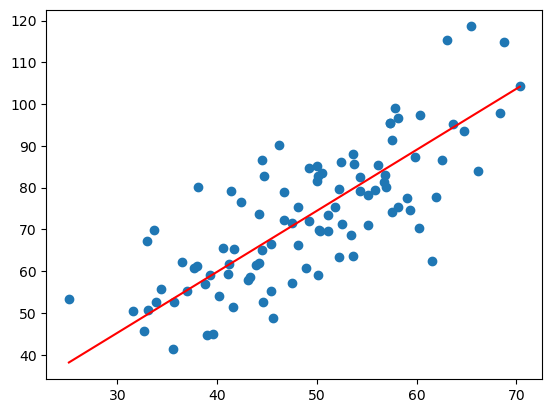

In [12]:
# for Stochastic Gradient Descent, you would set batch_size to 1
weights_b2 = mini_batch_gradient_descent(alpha_b, epochs_b, 0.00001, X, y, 1)
y_hat_b2 = np.dot(PolynomialFeatures(1).fit_transform(X),weights_b2)
plt.scatter(X, Y)
plt.plot([min(X), max(X)], [min(y_hat_b2), max(y_hat_b2)], color='red') # predicted
plt.show()

In [13]:
# Calculate MSEs for stochastic gradient descent and mini-batch gradient descent
mse_sgd = np.mean((y_hat_b2 - y)**2)
mse_mbgd = np.mean((y_hat_b1 - y)**2)
print("MSE for stochastic gradient descent is", mse_sgd, "and MSE for mini-batch gradient descent is", mse_mbgd)

MSE for stochastic gradient descent is 110.22765062173971 and MSE for mini-batch gradient descent is 110.1134173899535
